In [1]:
# import libraries
import numpy as np
import pandas as pd
from scipy import stats
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
import sklearn.metrics as skm
import matplotlib.pyplot as plt
import seaborn as sns
import copy, time, matplotlib, sys

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, TensorDataset, Dataset, Subset
from torchsummary import summary

import torchvision
import torchvision.transforms as T

import matplotlib_inline.backend_inline
matplotlib_inline.backend_inline.set_matplotlib_formats('svg')
# plt.rcParams.update({'font.size':11})

In [2]:
# use GPU if available
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda', index=0)

# The canonical CNN architecture

In [ ]:
'''
* The three types of layers in a CNN.
1) Convolution: Learn filters (kernels) to create feature maps.
2) Pooling: Reduce dimensionality and increase receptive field size.
3) Fully connected: Prediction (categorical and/or continuous)

* Typical CNN architectural design
- (Convolution -> Pooling) x N -> Fully connected

- With increasing depth:
  Image resolution (number of pixels) decreases
  Representation resolution (number of filters) increases

  => reduction of number of pixels within each feature map
  : each successive block in this deep neuron network has fewer pixels
  which means each individual pixel sees a larger area of image (receptive field size is larger)

  => simultaneously, the complexity of information (abstractness of information) that the model can represent
  which is governed by depth (width of each layer) is increasing with each convolution & pooling block.

  Layers are smaller (number of pixels) but wider (number of feature maps).

* Visualizations of CNN architectures.
- Google image search for "convolutional neural networks."
- Take a moment to inspect the variations on visualizations.
- Notice that all visualizations have the same three layers:
  convolution, pooling, linear.

'''

# CNN to classify MNIST digits

In [ ]:
'''
* How to report the sizes of layers in the model.
'''

## Import and process the data

In [ ]:
data = np.loadtxt(open('sample_data/mnist_train_small.csv', 'rb'), delimiter=',')

labels = data[:,0]
data = data[:,1:]

dataNorm = data / np.max(data)

# NEW: reshape to 2D!
dataNorm = dataNorm.reshape(dataNorm.shape[0],1,28,28)

dataNorm.shape

(20000, 1, 28, 28)

## Create train/test groups using DataLoader

In [ ]:
# Step 1 : convert to tensor
data_tensor = torch.tensor(dataNorm).float()
labels_tensor = torch.tensor(labels).long()

# Step 2 : split the data
train_data, test_data, train_labels, test_labels = train_test_split(data_tensor, labels_tensor, test_size=.1)

# Step 3 : convert into PyTorch Datasets
trainset = TensorDataset(train_data, train_labels)
testset = TensorDataset(test_data, test_labels)

# Step 4 : translate into DataLoader objects
batchsize=32
train_loader = DataLoader(trainset, batch_size=batchsize, shuffle=True, drop_last=True)
test_loader = DataLoader(testset, batch_size=testset.tensors[0].shape[0])

In [ ]:
# check size (should be images X channels X width X height)
train_loader.dataset.tensors[0].shape

torch.Size([18000, 1, 28, 28])

## Create the DL model

In [ ]:
def createTheMNISTNet(print_toggle=False):

    class mnistNet(nn.Module):
        def __init__(self, print_toggle):
            super().__init__()

            # convolution layers
            self.conv1 = nn.Conv2d(1,10, kernel_size=5, stride=1, padding=1)
            # size: np.floor( (28 + 2*1 - 5)/1 ) + 1 = 26 / 2 = 13 (maxpool)

            self.conv2 = nn.Conv2d(10, 20, kernel_size=5, stride=1, padding=1)
            # size: np.floor( (13 + 2*1 - 5)/1 ) + 1 = 11 / 2 = 5 (maxpool)

            # compute the number of units in  FClayer (number of outputs of conv2)
            expectSize = np.floor( (5 + 2*0 -1)/1 ) + 1 # fc1 layer has no padding or kernel, so set to 0/1
            expectSize = 20 * int(expectSize**2)

            # fully-connected layer
            self.fc1 = nn.Linear(expectSize, 50)

            # output layer
            self.out = nn.Linear(50, 10)

            # toggle for printing out tensor sizes during forward prop
            self.print = print_toggle

        def forward(self, x):

            print(f'Input: {x.shape}') if self.print else None

            # convolution -> maxpool -> relu
            x = F.relu(F.max_pool2d(self.conv1(x), 2))
            print(f'Layer conv1/pool1: {x.shape}') if self.print else None

            # convolution -> maxpool -> relu
            x = F.relu(F.max_pool2d(self.conv2(x), 2))
            print(f'Layer conv2/pool2: {x.shape}') if self.print else None

            # reshape for linear layer
            nUnits = x.shape.numel() / x.shape[0]
            x = x.view(-1, int(nUnits))
            if self.print: print(f'Vectorize: {x.shape}')

            # linear layers
            x = F.relu(self.fc1(x))
            if self.print: print(f'Layer fc1: {x.shape}')
            x = self.out(x)
            if self.print: print(f'Layer out: {x.shape}')

            return x

    net = mnistNet(print_toggle)

    lossfunc = nn.CrossEntropyLoss()

    optimizer = torch.optim.Adam(net.parameters(), lr=.001)

    return net, lossfunc, optimizer

In [ ]:
# test the model with one batch
net, lossfunc, optimizer = createTheMNISTNet(True)

X, y = next(iter(train_loader))
yHat = net(X)

# check sizes of model outputs and target variable
print()
print(yHat.shape)
print()
print(y.shape)

Input: torch.Size([32, 1, 28, 28])
Layer conv1/pool1: torch.Size([32, 10, 13, 13])
Layer conv2/pool2: torch.Size([32, 20, 5, 5])
Vectorize: torch.Size([32, 500])
Layer fc1: torch.Size([32, 50])
Layer out: torch.Size([32, 10])

torch.Size([32, 10])

torch.Size([32])


In [ ]:
# now let's compute the loss
loss = lossfunc(yHat, y)
print('Loss:')
print(loss)

Loss:
tensor(2.3061, grad_fn=<NllLossBackward0>)


In [ ]:
# count the total number of parameters in the model
summary(net, (1,28,28))

Input: torch.Size([2, 1, 28, 28])
Layer conv1/pool1: torch.Size([2, 10, 13, 13])
Layer conv2/pool2: torch.Size([2, 20, 5, 5])
Vectorize: torch.Size([2, 500])
Layer fc1: torch.Size([2, 50])
Layer out: torch.Size([2, 10])
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 10, 26, 26]             260
            Conv2d-2           [-1, 20, 11, 11]           5,020
            Linear-3                   [-1, 50]          25,050
            Linear-4                   [-1, 10]             510
Total params: 30,840
Trainable params: 30,840
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.07
Params size (MB): 0.12
Estimated Total Size (MB): 0.19
----------------------------------------------------------------


## Create a function that trains the model

In [ ]:
def function2trainTheModel():

    numepochs = 10

    net, lossfunc, optimizer = createTheMNISTNet()

    losses = torch.zeros(numepochs)
    trainAcc = []
    testAcc = []

    for epochi in range(numepochs):

        net.train()

        batchAcc = []
        batchLoss = []
        for X, y in train_loader:
            yHat = net(X)
            loss = lossfunc(yHat, y)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            batchLoss.append(loss.item())
            batchAcc.append( 100 * torch.mean((torch.argmax(yHat, axis=1)==y).float()).item() )

        trainAcc.append(np.mean(batchAcc))
        losses[epochi] = np.mean(batchLoss)

        net.eval()

        X, y = next(iter(test_loader))
        with torch.no_grad():
            yHat = net(X)
        testAcc.append(100 * torch.mean((torch.argmax(yHat, axis=1)==y).float()).item() )

    return trainAcc, testAcc, losses, net

## Run the model and show the results!

In [ ]:
trainAcc, testAcc, losses, net = function2trainTheModel()

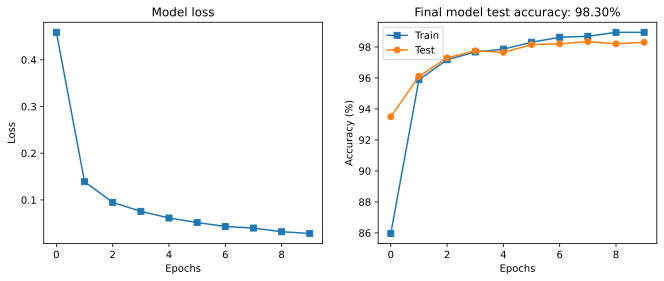

In [ ]:
fig, ax = plt.subplots(1,2,figsize=(11,4))

ax[0].plot(losses, 's-')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Loss')
ax[0].set_title('Model loss')

ax[1].plot(trainAcc, 's-', label='Train')
ax[1].plot(testAcc, 'o-', label='Test')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Accuracy (%)')
ax[1].set_title(f'Final model test accuracy: {testAcc[-1]:.2f}%')
ax[1].legend()

plt.show()

# CNN on shifted MNIST

## Shift the test images by a few pixels

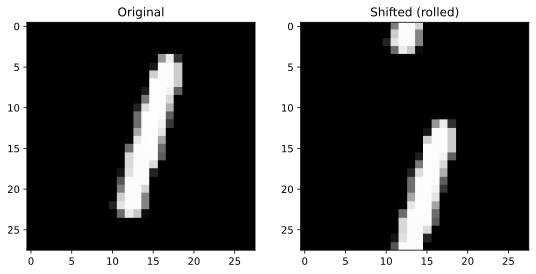

In [ ]:
# first let's see how to shift a vectorized image

# grab one image data
tmp = test_loader.dataset.tensors[0][0,:]
# tmp = tmp.reshape(28,28) # reshape to 2D image

# shift the image (pytorch calls it "rolling")
tmpS = torch.roll(tmp, 8, dims=1)

# now show them both
fig, ax = plt.subplots(1,2,figsize=(9,6))
ax[0].imshow(torch.squeeze(tmp), cmap='gray')
ax[0].set_title('Original')

ax[1].imshow(torch.squeeze(tmpS), cmap='gray')
ax[1].set_title('Shifted (rolled)')

plt.show()

In [ ]:
# now repeat for all images in the training set

for i in range(train_loader.dataset.tensors[0].shape[0]):

    # get the image
    img = train_loader.dataset.tensors[0][i,:,:]

    # reshape and roll by 10 pixels
    randroll = np.random.randint(-10,11)
    img = torch.roll(img, randroll, dims=1)

    # re-vectorize and put back into the matrix
    train_loader.dataset.tensors[0][i,:,:] = img

In [ ]:
# now repeat for all images in the test set

for i in range(test_loader.dataset.tensors[0].shape[0]):

    # get the image
    img = test_loader.dataset.tensors[0][i,:,:]

    # reshape and roll by 10 pixels
    randroll = np.random.randint(-10,11)
    img = torch.roll(img, randroll, dims=1)

    # re-vectorize and put back into the matrix
    test_loader.dataset.tensors[0][i,:,:] = img

## Create the DL model

In [ ]:
def createTheMNISTNet(print_toggle=False):

    class mnistNet(nn.Module):
        def __init__(self, print_toggle):
            super().__init__()

            # convolution layers
            self.conv1 = nn.Conv2d(1, 10, kernel_size=5, stride=1, padding=1)
            # size: ( (28 + 2*1 - 5)/1) + 1 = 26 / 2 = 13 (maxpool)

            self.conv2 = nn.Conv2d(10, 20, kernel_size=5, stride=1, padding=1)
            # size: ( (13 + 2*1 - 5)/1 ) + 1 = 11 / 2 = 5 (maxpool)

            # compute the number of units in FClayer (number of outputs of conv2)
            expectSize = 20 * int(5**2)

            # fully-connected layer
            self.fc1 = nn.Linear(expectSize, 50)

            # output layer
            self.out = nn.Linear(50, 10)

            # toggle for printing out tensor sizes during forward prop
            self.print = print_toggle

        def forward(self, x):
            print(f'Input: {x.shape}') if self.print else None

            # convolution -> maxpool -> relu
            x = F.relu( F.max_pool2d(self.conv1(x), 2) )
            print(f'Layer Conv1: {x.shape}') if self.print else None

            # convolution -> maxpool -> relu
            x = F.relu( F.max_pool2d(self.conv2(x), 2) )
            print(f'Layer Conv2: {x.shape}') if self.print else None

            # reshape for linear layer
            nUnits = x.shape.numel() / x.shape[0]
            x = x.view(-1, int(nUnits))
            print(f'Vectorized: {x.shape}') if self.print else None

            # linear layers
            x = F.relu(self.fc1(x))
            print(f'Layer Fc1: {x.shape}') if self.print else None
            x = self.out(x)
            print(f'Layer Out: {x.shape}') if self.print else None

            return x

    net = mnistNet(print_toggle)
    lossfunc = nn.CrossEntropyLoss()
    optimizer = torch.optim.Adam(net.parameters(), lr=.001)

    return net, lossfunc, optimizer

## Create a funciton that trains the model

In [ ]:
def function2trainTheModel():

    numepochs = 30

    net, lossfunc, optimizer = createTheMNISTNet()

    trainLosses = torch.zeros(numepochs)
    testLosses = torch.zeros(numepochs)
    trainAcc = []
    testAcc = []

    for epochi in range(numepochs):

        batchAcc = []
        batchLoss = []
        for X, y in train_loader:

            yHat = net(X)
            loss = lossfunc(yHat, y)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            batchLoss.append(loss.item())
            batchAcc.append( 100 * torch.mean((torch.argmax(yHat, axis=1)==y).float()).item() )

        trainAcc.append(np.mean(batchAcc))
        trainLosses[epochi] = np.mean(batchLoss)

        X, y = next(iter(test_loader))
        with torch.no_grad():
            yHat = net(X)
            loss = lossfunc(yHat, y)
        testAcc.append( 100 * torch.mean((torch.argmax(yHat, axis=1)==y).float()).item() )
        testLosses[epochi] = loss.item()

    return trainAcc, testAcc, trainLosses, testLosses, net

## Run the model and show the results!

In [ ]:
trainAcc, testAcc, trainLosses, testLosses, net = function2trainTheModel()

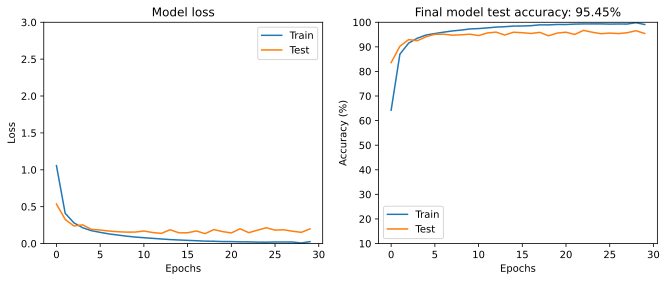

In [ ]:
fig, ax = plt.subplots(1,2,figsize=(11,4))

ax[0].plot(trainLosses, label='Train')
ax[0].plot(testLosses, label='Test')
ax[0].set_ylabel('Loss')
ax[0].set_xlabel('Epochs')
ax[0].set_title('Model loss')
ax[0].set_ylim([0,3])
ax[0].legend()

ax[1].plot(trainAcc, label='Train')
ax[1].plot(testAcc, label='Test')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Accuracy (%)')
ax[1].set_title(f'Final model test accuracy: {testAcc[-1]:.2f}%')
ax[1].set_ylim([10,100])
ax[1].legend()

plt.show()

# Classify Gaussian blurs

In [ ]:
'''
* conv-maxpool block: Image processing (transform the image into feature representations)
* fully connected layer: Categorization (make decisions based on features (standard ANN!))
'''

## Create Gaussian blurs with different widths

In [ ]:
nPerClass = 1000
imgSize = 91

x = np.linspace(-4,4,imgSize)
X, Y = np.meshgrid(x,x)

# the two widths (a.u.)
widths = [1.8, 2.4]

# initialize tensors containing images and labels
images = torch.zeros(2*nPerClass, 1, imgSize, imgSize)
labels = torch.zeros(2*nPerClass)

for i in range(2*nPerClass):

    # create the gaussian with random centers
    ro = 2 * np.random.randn(2) # ro = random offset
    G = np.exp( -( (X-ro[0])**2 + (Y-ro[1])**2 ) / (2*widths[i%2]**2) )

    # and add noise
    G = G + np.random.randn(imgSize, imgSize) / 4

    # add to the tensor
    images[i,:,:,:] = torch.tensor(G).view(1, imgSize, imgSize)
    labels[i] = i%2

labels = labels[:, None]

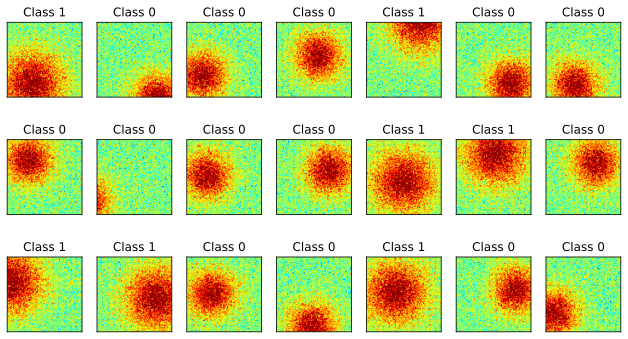

In [ ]:
# visualize some images
fig, axs = plt.subplots(3,7,figsize=(11,6))

for i, ax in enumerate(axs.flatten()):
    whichpic = np.random.randint(2*nPerClass)
    G = np.squeeze( images[whichpic,:,:] )
    ax.imshow(G, vmin=-1, vmax=1, cmap='jet')
    ax.set_title('Class %s' % int(labels[whichpic].item()))
    ax.set_xticks([])
    ax.set_yticks([])

plt.show()

## Create train/test groups using DataLoader

In [ ]:
train_data, test_data, train_labels, test_labels = train_test_split(images, labels, test_size=.1)

trainset = TensorDataset(train_data, train_labels)
testset = TensorDataset(test_data, test_labels)

batchsize=32
train_loader = DataLoader(trainset, batch_size=batchsize, shuffle=True, drop_last=True)
test_loader = DataLoader(testset, batch_size=testset.tensors[0].shape[0])

In [ ]:
# check size (should be images X channels X width X height)
print(train_loader.dataset.tensors[0].shape)
print(test_loader.dataset.tensors[0].shape)

torch.Size([1800, 1, 91, 91])
torch.Size([200, 1, 91, 91])


## Create the DL model

In [ ]:
def makeTheNet():

    class gausnet(nn.Module):
        def __init__(self):
            super().__init__()

            # all layers in one go using nn.Sequential
            self.enc = nn.Sequential(
                nn.Conv2d(1, 6, 3, padding=1),                     # output size: (91 + 2*1 - 3) / 1 + 1 = 91
                nn.ReLU(),                                                     # note that relu is treated like a "layer"
                nn.AvgPool2d(2, 2),                                       # output size: 91 / 2 = 45
                nn.Conv2d(6, 4, 3, padding=1),                     # output size: (45 + 2*1 - 3)/1 + 1 = 45
                nn.ReLU(),
                nn.AvgPool2d(2, 2),                                       # output size: 45 / 2 = 22
                nn.Flatten(),                                                   # vectorize conv output
                nn.Linear(22*22*4, 50),                                 # output size: 50
                nn.Linear(50, 1),                                            # output size: 1
            )

        def forward(self, x):
            return self.enc(x)

    net = gausnet()
    lossfunc = nn.BCEWithLogitsLoss()
    optimizer = torch.optim.Adam(net.parameters(), lr=.001)

    return net, lossfunc, optimizer

In [ ]:
# test the model with one batch
net, lossfunc, optimizer = makeTheNet()

X, y = next(iter(train_loader))
yHat = net(X)

# check size of output
print()
print(yHat.shape)

# now let's compute the loss
loss = lossfunc(yHat, y)
print()
print('Loss:')
print(loss)


torch.Size([32, 1])

Loss:
tensor(0.6888, grad_fn=<BinaryCrossEntropyWithLogitsBackward0>)


In [ ]:
# count the total number of parameters in the model
summary(net, (1,imgSize, imgSize))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1            [-1, 6, 91, 91]              60
              ReLU-2            [-1, 6, 91, 91]               0
         AvgPool2d-3            [-1, 6, 45, 45]               0
            Conv2d-4            [-1, 4, 45, 45]             220
              ReLU-5            [-1, 4, 45, 45]               0
         AvgPool2d-6            [-1, 4, 22, 22]               0
           Flatten-7                 [-1, 1936]               0
            Linear-8                   [-1, 50]          96,850
            Linear-9                    [-1, 1]              51
Total params: 97,181
Trainable params: 97,181
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.03
Forward/backward pass size (MB): 1.00
Params size (MB): 0.37
Estimated Total Size (MB): 1.41
---------------------------------------------

## Create a function that trains the model

In [ ]:
def function2trainTheModel():

    numepochs = 10

    net, lossfunc, optimizer = makeTheNet()

    trainLoss = torch.zeros(numepochs)
    testLoss = torch.zeros(numepochs)
    trainAcc = torch.zeros(numepochs)
    testAcc = torch.zeros(numepochs)

    for epochi in range(numepochs):

        batchAcc = []
        batchLoss = []
        for X, y in train_loader:

            yHat = net(X)
            loss = lossfunc(yHat, y)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            batchLoss.append(loss.item())
            batchAcc.append( 100 * torch.mean(((yHat>0)==y).float()).item() )

        trainAcc[epochi] = np.mean(batchAcc)
        trainLoss[epochi] = np.mean(batchLoss)

        X, y = next(iter(test_loader))
        with torch.no_grad():
            yHat = net(X)
            loss = lossfunc(yHat, y)

        testAcc[epochi] = 100 * torch.mean(((yHat>0)==y).float()).item()
        testLoss[epochi] = loss.item()

    return trainLoss, testLoss, trainAcc, testAcc, net

## Run the model and show the results!

In [ ]:
trainLoss, testLoss, trainAcc, testAcc, net = function2trainTheModel()

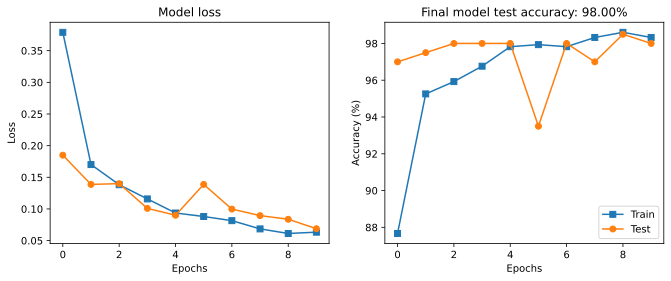

In [ ]:
fig, ax = plt.subplots(1,2,figsize=(11,4))

ax[0].plot(trainLoss,'s-',label='Train')
ax[0].plot(testLoss,'o-',label='Test')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Loss')
ax[0].set_title('Model loss')

ax[1].plot(trainAcc,'s-',label='Train')
ax[1].plot(testAcc,'o-',label='Test')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Accuracy (%)')
ax[1].set_title(f'Final model test accuracy: {testAcc[-1]:.2f}%')
ax[1].legend()

plt.show()

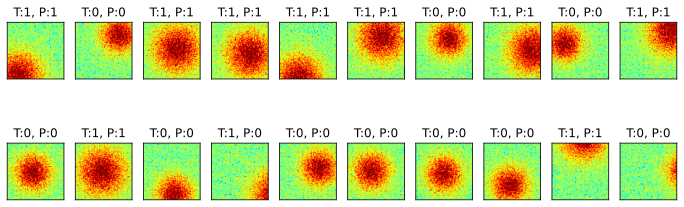

In [ ]:
# visualize some images
X, y = next(iter(test_loader))
yHat = net(X)

fig, axs = plt.subplots(2,10, figsize=(12,4))

for i, ax in enumerate(axs.flatten()):
    G = torch.squeeze(X[i,0,:,:].detach())
    ax.imshow(G, vmin=-1, vmax=1, cmap='jet')
    t = (int(y[i].item()), int(yHat[i].item()>0) )
    ax.set_title('T:%s, P:%s' %t)
    ax.set_xticks([])
    ax.set_yticks([])

plt.show()

In [ ]:
# look at the filters
print(net)

layer1W = net.enc[0].weight
layer3W = net.enc[3].weight

print()
print(layer1W.shape)
print(layer3W.shape)

gausnet(
  (enc): Sequential(
    (0): Conv2d(1, 6, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): AvgPool2d(kernel_size=2, stride=2, padding=0)
    (3): Conv2d(6, 4, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): ReLU()
    (5): AvgPool2d(kernel_size=2, stride=2, padding=0)
    (6): Flatten(start_dim=1, end_dim=-1)
    (7): Linear(in_features=1936, out_features=50, bias=True)
    (8): Linear(in_features=50, out_features=1, bias=True)
  )
)

torch.Size([6, 1, 3, 3])
torch.Size([4, 6, 3, 3])


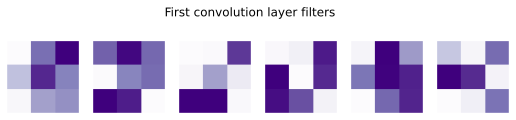

In [ ]:
fig, axs = plt.subplots(1,6,figsize=(9,2))

for i, ax in enumerate(axs.flatten()):
    ax.imshow(torch.squeeze(layer1W[i,:,:,:]).detach(), cmap='Purples')
    ax.axis('off')

plt.suptitle('First convolution layer filters')
plt.show()

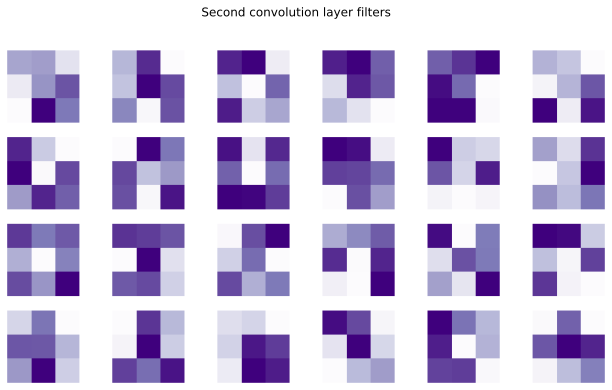

In [ ]:
fig, axs = plt.subplots(4,6,figsize=(11,6))

for i in range(6*4):
    idx = np.unravel_index(i, (4,6))
    axs[idx].imshow( torch.squeeze(layer3W[idx[0], idx[1], :,:]).detach(), cmap='Purples' )
    axs[idx].axis('off')

plt.suptitle('Second convolution layer filters')
plt.show()

In [ ]:
''' Discussion

- The weights (convolution kernels) change during learning but are fixed after learning.
  They are independent of the data.
- The activation of the layers in each channel (feature maps) are not learned;
  They are representations of the data.
  They can look completely different for different images, although the weights are identical.

'''

# Examine feature map activations

## Create the DL model

In [ ]:
def makeTheNet():

    class gausnet(nn.Module):
        def __init__(self):
            super().__init__()

            # conv1
            self.conv1 = nn.Conv2d(1,6,3,padding=1)
            # output size: (91 + 2*1 - 3)/1 + 1 = 91
            # post-poling: 91 / 2 = 45

            # conv2
            self.conv2 = nn.Conv2d(6,4,3,padding=1)
            # output size: (45 + 2*1 - 3)/1 + 1 = 45
            # post-poling: 45 / 2 = 22

            # fc1
            self.fc1 = nn.Linear(22*22*4, 50)

            # fc2 (output)
            self.fc2 = nn.Linear(50, 1)

        def forward(self, x):
            # first conv-pool set
            conv1act = F.relu(self.conv1(x))
            x = F.avg_pool2d(conv1act, (2,2))

            # second conv-pool set
            conv2act = F.relu(self.conv2(x))
            x = F.avg_pool2d(conv2act, (2,2))

            # ANN part
            x = x.reshape(x.shape[0], -1)
            x = F.relu(self.fc1(x))
            x = self.fc2(x)

            return x, conv1act, conv2act

    net = gausnet()
    lossfunc = nn.BCEWithLogitsLoss()
    optimizer = torch.optim.Adam(net.parameters(), lr=.001)

    return net, lossfunc, optimizer

In [ ]:
# test the model with one batch
net, lossfunc, optimizer = makeTheNet()

# test that the model runs and can comput a loss
X, y = next(iter(train_loader))
yHat, featmap1, featmap2 = net(X)
loss = lossfunc(yHat, y)

# check sizes of outputs
print('Predicted category:')
print(yHat.shape)
print('\nFeature map after conv1')
print(featmap1.shape)
print('\nFeature map after conv2')
print(featmap2.shape)

Predicted category:
torch.Size([32, 1])

Feature map after conv1
torch.Size([32, 6, 91, 91])

Feature map after conv2
torch.Size([32, 4, 45, 45])


In [ ]:
# count the total number of parameters in the model
summary(net, (1, imgSize, imgSize))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1            [-1, 6, 91, 91]              60
            Conv2d-2            [-1, 4, 45, 45]             220
            Linear-3                   [-1, 50]          96,850
            Linear-4                    [-1, 1]              51
Total params: 97,181
Trainable params: 97,181
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.03
Forward/backward pass size (MB): 0.44
Params size (MB): 0.37
Estimated Total Size (MB): 0.84
----------------------------------------------------------------


## Create a function that trains the model

In [ ]:
def function2trainTheModel():

    numepochs = 10

    net, lossfunc, optimizer = makeTheNet()

    trainLoss = torch.zeros(numepochs)
    testLoss = torch.zeros(numepochs)
    trainAcc = torch.zeros(numepochs)
    testAcc = torch.zeros(numepochs)

    for epochi in range(numepochs):

        batchAcc = []
        batchLoss = []
        for X, y in train_loader:
            yHat = net(X)[0]
            loss = lossfunc(yHat, y)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            batchLoss.append(loss.item())
            batchAcc.append( 100 * torch.mean(((yHat>0)==y).float()).item() )

        trainLoss[epochi] = np.mean(batchLoss)
        trainAcc[epochi] = np.mean(batchAcc)

        X, y = next(iter(test_loader))
        with torch.no_grad():
            yHat = net(X)[0]
            loss = lossfunc(yHat, y)
        testLoss[epochi] = loss.item()
        testAcc[epochi] = 100 * torch.mean(((yHat>0)==y).float()).item()

    return trainLoss, testLoss, trainAcc, testAcc, net

## Run the model and show the results!

In [ ]:
trainLoss, testLoss, trainAcc, testAcc, net = function2trainTheModel()

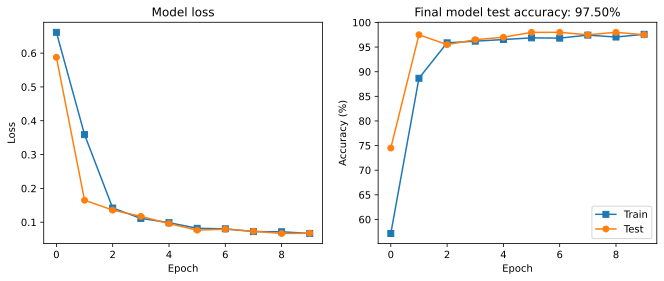

In [ ]:
fig, ax = plt.subplots(1,2,figsize=(11,4))

ax[0].plot(trainLoss, 's-', label='Train')
ax[0].plot(testLoss, 'o-', label='Test')
ax[0].set_xlabel('Epoch')
ax[0].set_ylabel('Loss')
ax[0].set_title('Model loss')

ax[1].plot(trainAcc, 's-', label='Train')
ax[1].plot(testAcc, 'o-', label='Test')
ax[1].set_xlabel('Epoch')
ax[1].set_ylabel('Accuracy (%)')
ax[1].set_title(f'Final model test accuracy: {testAcc[-1]:.2f}%')
ax[1].legend()

plt.show()

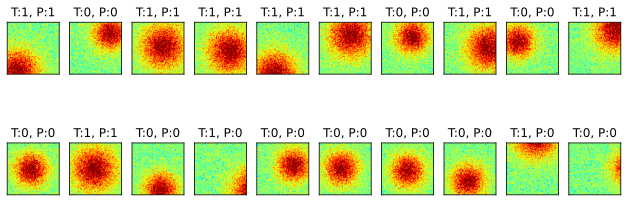

In [ ]:
# visualize some images
X, y = next(iter(test_loader))

yHat, featmap1, featmap2 = net(X)

fig, axs = plt.subplots(2,10,figsize=(11,4))

for i, ax in enumerate(axs.flatten()):
    G = torch.squeeze(X[i,0,:,:]).detach()
    ax.imshow(G, vmin=-1, vmax=1, cmap='jet')
    t = ( int(y[i].item()), int(yHat[i].item()>0) )
    ax.set_title('T:%s, P:%s' %t)
    ax.set_xticks([])
    ax.set_yticks([])

plt.show()

## Draw the feature maps

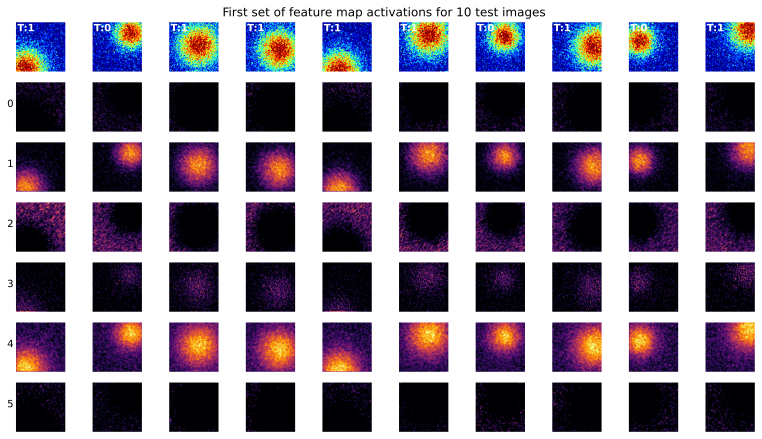

In [ ]:
# Feature maps from the conv1 layer

fig, axs = plt.subplots(7,10,figsize=(11,6))

for pici in range(10):
    # show the original picture
    img = X[pici,0,:,:].detach()
    axs[0,pici].imshow(img, cmap='jet', vmin=0, vmax=1)
    axs[0,pici].axis('off')
    axs[0,pici].text(2,2, 'T:%s'%int(y[pici].item()), ha='left', va='top', color='w', fontweight='bold')

    for feati in range(6):
        # extract the feature map from this image
        img = featmap1[pici,feati, :,:].detach()
        axs[feati+1,pici].imshow(img, cmap='inferno', vmin=0, vmax=torch.max(img)*.9)
        axs[feati+1,pici].axis('off')
        axs[feati+1,pici].text(-5,45,feati, ha='right') if pici==0 else None

plt.tight_layout()
plt.suptitle('First set of feature map activations for 10 test images', x=.5, y=1.01)
plt.show()

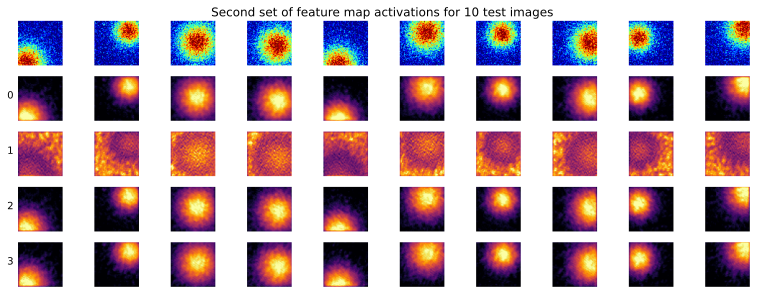

In [ ]:
# Repeat for feature2 maps

fig,axs = plt.subplots(5,10,figsize=(11,4))

for pici in range(10):

  # show the original picture
  img = X[pici,0,:,:].detach()
  axs[0,pici].imshow(img,cmap='jet',vmin=0,vmax=1)
  axs[0,pici].axis('off')

  for feati in range(4):
    # extract the feature map from this image
    img = featmap2[pici,feati,:,:].detach()
    axs[feati+1,pici].imshow(img,cmap='inferno',vmin=0,vmax=torch.max(img)*.9)
    axs[feati+1,pici].axis('off')
    axs[feati+1,pici].text(-5,22,feati,ha='right') if pici==0 else None

plt.tight_layout()
plt.suptitle('Second set of feature map activations for 10 test images',x=.5,y=1.01)
plt.show()

## Spatial correlations across the feature maps

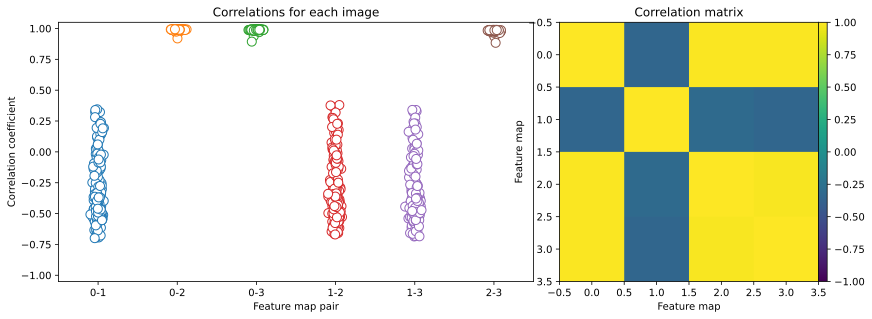

In [ ]:
# correlations across the SECOND convolution layer

# convenient variables
nStim = featmap2.shape[0]
nMaps = featmap2.shape[1]
nCors = (nMaps*(nMaps-1)) // 2

# initialize the matrix of all correlation values
allrs = np.zeros((nStim, nCors))
Call = np.zeros((nMaps, nMaps))

# loop over each stimulus
for i in range(nStim):

    # extract the vectorized feature maps from this image
    featmaps = featmap2[i,:,:,:].view(nMaps, -1).detach()

    # compute the correlation matrix
    C = np.corrcoef(featmaps)
    Call += C

    # extract the unique correlations from the matrix
    idx = np.nonzero(np.triu(C, 1))
    allrs[i,:] = C[idx]

    # define the x-axis labels
    xlab = [] * nCors
    for i in range(nCors):
        xlab.append('%s-%s' %(idx[0][i], idx[1][i]))

# now visualize the correlations
fig = plt.figure(figsize=(12,4))
ax0 = fig.add_axes([.1,.1,.55,.9]) # [left, bottom, width, height]
ax1 = fig.add_axes([.68,.1,.3,.9])
cax = fig.add_axes([.98,.1,.01,.9])

for i in range(nCors):
    ax0.plot(i+np.random.randn(nStim)/30, allrs[:,i],'o', markerfacecolor='w', markersize=9)

# make the plot more interpretable
ax0.set_xlim([-.5,nCors-.5])
ax0.set_ylim([-1.05,1.05])
ax0.set_xticks(range(nCors))
ax0.set_xticklabels(xlab)
ax0.set_xlabel('Feature map pair')
ax0.set_ylabel('Correlation coefficient')
ax0.set_title('Correlations for each image')


# now show the average correlation matrix
h = ax1.imshow(Call/nStim,vmin=-1,vmax=1)
ax1.set_title('Correlation matrix')
ax1.set_xlabel('Feature map')
ax1.set_ylabel('Feature map')
# add a colorbar
fig.colorbar(h,cax=cax)

plt.show()

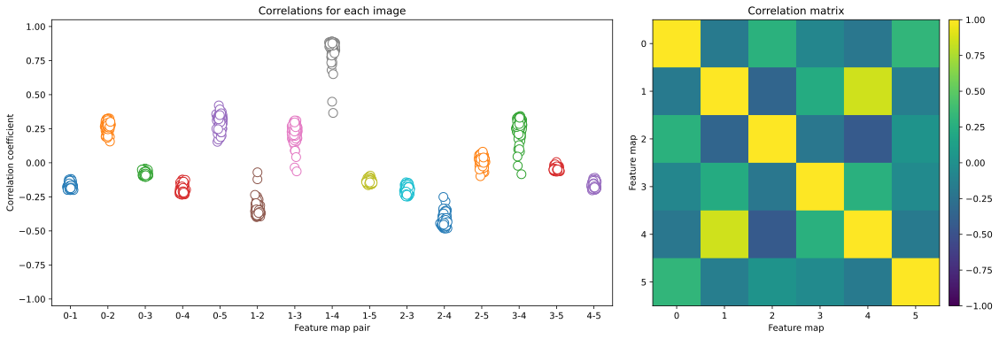

In [ ]:
### correlations across the FIRST convolution layer

# convenient variables
nStim = featmap1.shape[0]
nMaps = featmap1.shape[1]
nCors = (nMaps*(nMaps-1))//2

# initialze the matrix of all correlation values
allrs = np.zeros((nStim,nCors))
Call  = np.zeros((nMaps,nMaps))

# loop over each stimulus
for i in range(nStim):

  # extract the vectorized feature maps from this image
  featmaps = featmap1[i,:,:,:].view(nMaps,-1).detach()

  # compute the correlation matrix
  C = np.corrcoef(featmaps)
  Call += C

  # extract the unique correlations from the matrix
  idx = np.nonzero(np.triu(C,1))
  allrs[i,:] = C[idx]


# define the x-axis labels
xlab = []*nCors
for i in range(nCors):
  xlab.append('%s-%s' %(idx[0][i],idx[1][i]))

# now visualize the correlations
fig = plt.figure(figsize=(16,5))
ax0 = fig.add_axes([.1,.1,.55,.9]) # [left, bottom, width, height]
ax1 = fig.add_axes([.68,.1,.3,.9])
cax = fig.add_axes([.98,.1,.01,.9])

for i in range(nCors):
  ax0.plot(i+np.random.randn(nStim)/30,allrs[:,i],'o',markerfacecolor='w',markersize=10)

# make the plot more interpretable
ax0.set_xlim([-.5,nCors-.5])
ax0.set_ylim([-1.05,1.05])
ax0.set_xticks(range(nCors))
ax0.set_xticklabels(xlab)
ax0.set_xlabel('Feature map pair')
ax0.set_ylabel('Correlation coefficient')
ax0.set_title('Correlations for each image')


# now show the average correlation matrix
h = ax1.imshow(Call/nStim,vmin=-1,vmax=1)
ax1.set_title('Correlation matrix')
ax1.set_xlabel('Feature map')
ax1.set_ylabel('Feature map')
# add a colorbar
fig.colorbar(h,cax=cax)

plt.show()

In [ ]:
''' Discussion

- Weights are fixed; feature layer activations require data.
- Convolution layers learn features but don't make decisions;
  fully-connected layers use those features to make decisions.
- Feature map activations can (should!) be qualitatively and quantitatively inspected.
  Empty or near-identical maps indicate gratuitous complexity.
- Simple models are "easy" to inspect;
  larger models become increasingly difficult. Develop the habit of thinking critically about model architecture.

'''

# Softcode internal parameters

## Create Gaussian blurs with different widths

In [ ]:
nPerClass = 1000
imgSize = 91

x = np.linspace(-4,4,imgSize)
X, Y = np.meshgrid(x,x)

# the two widths (a.u.)
widths = [1.8, 2.4]

# initialize tensor containing images and labels
images = torch.zeros(2*nPerClass, 1, imgSize, imgSize)
labels = torch.zeros(2*nPerClass)

for i in range(2*nPerClass):

    # creaate the gaussian with random centers
    ro = 2 * np.random.randn(2)
    G = np.exp( -( (X-ro[0])**2 + (Y-ro[1])**2 ) / (2*widths[i%2]**2) )

    # and add noise
    G += np.random.randn(imgSize, imgSize)/4

    # add to the tensor
    images[i,:,:,:] = torch.tensor(G).view(1, imgSize, imgSize)
    labels[i] = i%2

labels = labels[:,None]

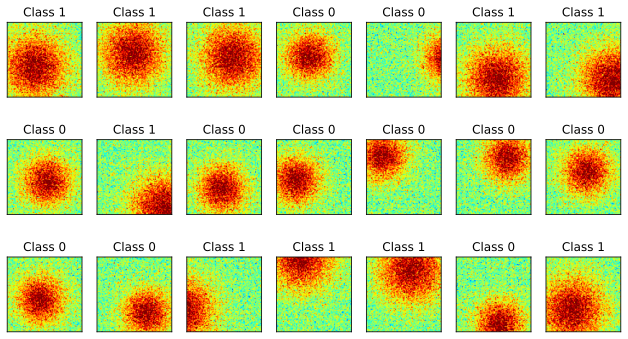

In [ ]:
# visualize some images
fig, axs = plt.subplots(3,7,figsize=(11,6))

for i, ax in enumerate(axs.flatten()):
    whichpic = np.random.randint(2*nPerClass)
    G = np.squeeze(images[whichpic,:,:])
    ax.imshow(G, vmin=-1, vmax=1, cmap='jet')
    ax.set_title('Class %s' %int(labels[whichpic].item()))
    ax.set_xticks([])
    ax.set_yticks([])

plt.show()

## Create train/test groups using DataLoader

In [ ]:
train_data, test_data, train_labels, test_labels = train_test_split(images, labels, test_size=.1)

trainset = TensorDataset(train_data, train_labels)
testset = TensorDataset(test_data, test_labels)

batchsize=32
train_loader = DataLoader(trainset, batch_size=batchsize, shuffle=True, drop_last=True)
test_loader = DataLoader(testset, batch_size=testset.tensors[0].shape[0])

## Create the DL model

In [ ]:
# create a class for the model
def makeTheNet():

  class gausnet(nn.Module):
    def __init__(self):
      super().__init__()


      # soft-coded variables
      k = (3,2)
      s = (2,3)

      ### conv1
      self.conv1 = nn.Conv2d(1,3,k,s)

      # output of convolution layer (second line is for pooling layer)
      imsizeW = np.floor( (91+2*self.conv1.padding[1]-k[1])/s[1] ) + 1
      imsizeW = np.floor( imsizeW/2 )
      imsizeH = np.floor( (91+2*self.conv1.padding[0]-k[0])/s[0] ) + 1
      imsizeH = np.floor( imsizeH/2 )


      ### conv2
      self.conv2 = nn.Conv2d(3,6,k,s)

      # output of convolution layer (second line is for pooling layer)
      # notice that it requires the image size from the previous conv-pool layer
      imsizeW = np.floor( (imsizeW+2*self.conv1.padding[1]-k[1])/s[1] ) + 1
      imsizeW = int( imsizeW/2 ) # input to nn.Linear must be ints, and int() rounds down
      imsizeH = np.floor( (imsizeH+2*self.conv1.padding[0]-k[0])/s[0] ) + 1
      imsizeH = int( imsizeH/2 ) # input to nn.Linear must be ints, and int() rounds down


      # fc1 (soft-coded number of input units!)
      self.fc1 = nn.Linear(imsizeW*imsizeH*self.conv2.out_channels,50)

      # fc2 (output)
      self.fc2 = nn.Linear(50,1)

    def forward(self,x):
      # first conv-pool set
      conv1act = F.relu(self.conv1(x))
      x = F.avg_pool2d(conv1act,(2,2))

      # second conv-pool set
      conv2act = F.relu(self.conv2(x))
      x = F.avg_pool2d(conv2act,(2,2))

      # ANN part
      x = x.reshape(x.shape[0],-1)
      x = F.relu( self.fc1(x) )
      x = self.fc2(x)

      return x,conv1act,conv2act

  # create the model instance
  net = gausnet()

  # loss function
  lossfun = nn.BCEWithLogitsLoss()

  # optimizer
  optimizer = torch.optim.Adam(net.parameters(),lr=.001)

  return net,lossfun,optimizer

In [ ]:
# test the model with one batch
net, lossfunc, optimizer = makeTheNet()

# test the model runs and can compute a loss
X, y = next(iter(train_loader))
yHat, featmap1, featmap2 = net(X)
loss = lossfunc(yHat, y)

# check sizes of outputs
print('Predicted category:')
print(yHat.shape)
print('\nFeature map after conv1')
print(featmap1.shape)
print('\nFeature map after conv2')
print(featmap2.shape)

Predicted category:
torch.Size([32, 1])

Feature map after conv1
torch.Size([32, 3, 45, 30])

Feature map after conv2
torch.Size([32, 6, 10, 5])


## Create a function that trains the model

In [ ]:
# a function that trains the model

def function2trainTheModel():

  # number of epochs
  numepochs = 10

  # create a new model
  net,lossfun,optimizer = makeTheNet()

  # initialize losses
  trainLoss = torch.zeros(numepochs)
  testLoss  = torch.zeros(numepochs)
  trainAcc  = torch.zeros(numepochs)
  testAcc   = torch.zeros(numepochs)


  # loop over epochs
  for epochi in range(numepochs):

    # loop over training data batches
    batchLoss = []
    batchAcc  = []
    for X,y in train_loader:

      # forward pass and loss
      yHat = net(X)[0] # we only need the first output
      loss = lossfun(yHat,y)

      # backprop
      optimizer.zero_grad()
      loss.backward()
      optimizer.step()

      # loss from this batch
      batchLoss.append(loss.item())
      batchAcc.append( torch.mean(( (yHat>0) ==y).float()).item() )
    # end of batch loop...

    # and get average losses across the batches
    trainLoss[epochi] = np.mean(batchLoss)
    trainAcc[epochi]  = 100*np.mean(batchAcc)

    # test accuracy
    X,y = next(iter(test_loader)) # extract X,y from test dataloader
    with torch.no_grad(): # deactivates autograd
      yHat = net(X)[0] # we only need the first output
      loss = lossfun(yHat,y)

    # compare the following really long line of code to the training accuracy lines
    testLoss[epochi] = loss.item()
    testAcc[epochi]  = 100*torch.mean(( (yHat>0) ==y).float()).item()

  # end epochs

  # function output
  return trainLoss,testLoss,trainAcc,testAcc,net

## Run the model and show the results!

In [ ]:
trainLoss,testLoss,trainAcc,testAcc,net = function2trainTheModel()

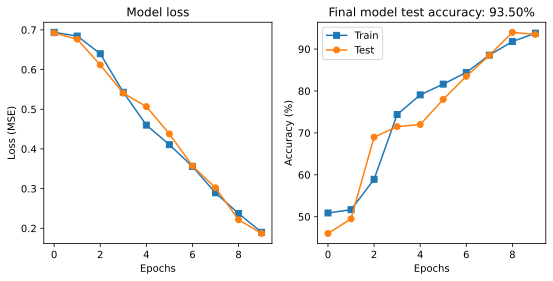

In [ ]:
fig,ax = plt.subplots(1,2,figsize=(9,4))

ax[0].plot(trainLoss,'s-',label='Train')
ax[0].plot(testLoss,'o-',label='Test')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Loss (MSE)')
ax[0].set_title('Model loss')

ax[1].plot(trainAcc,'s-',label='Train')
ax[1].plot(testAcc,'o-',label='Test')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Accuracy (%)')
ax[1].set_title(f'Final model test accuracy: {testAcc[-1]:.2f}%')
ax[1].legend()

plt.show()

# How wide the FC?

In [ ]:
'''
* Run an experiment on the effect of the number of units in the hidden layer of GausNet.
=> The results of the experiment : our manipulation didn't really makes such a big impact on the final performance of the model.
=> Useful to know. Because it means we do not need to add additional complexity to the model!!

If we are increasing complexity of the model, but the model is not doing any better,
then, in general we should prefer simpler models.
We generally prefer the simplest model that can do the task because that it has fewest parameters and it learns the astest.
'''

In [ ]:
''' GausNet

Image(1x91x91) -> conv1(6x91x91) -> maxpool1(6x45x45) -> conv2(4x45x45) -> maxpool2(4x22x22) -> fc1(1x2t) -> fc2(1xt) -> output 1x1)

* Set the number of units in (fc1, fc2) = (2t, t)
* Test performance for t in (5~500)
* Run the model on the GPU

'''

## Create the DL model

In [ ]:
def makeTheNet(fcUnits):

    class gausnet(nn.Module):
        def __init__(self):
            super().__init__()

            # all layers in one go using nn.Sequential
            self.enc = nn.Sequential(
                nn.Conv2d(1,6,3,padding=1),                 # output size: (91 + 2*1 - 3)/1 + 1 = 91
                nn.ReLU(),                                              # note that relu is treated like a "layer"
                nn.AvgPool2d(2,2),                                 # output size: 91 / 2 = 45
                nn.Conv2d(6,4,3,padding=1),                 # output size: (45 + 2*1 - 3)/1 + 1 = 45
                nn.ReLU(),
                nn.AvgPool2d(2,2),                                 # output size: 45 / 2 = 22
                nn.Flatten(),                                            # vectorize conv output
                nn.Linear(22*22*4, 2*fcUnits),                # output size: 2*fcUnits
                nn.ReLU(),
                nn.Linear(2*fcUnits, fcUnits),                  # output size: fcUnits
                nn.ReLU(),
                nn.Linear(fcUnits, 1)                               # output size: 1
            )

        def forward(self, x):
            return self.enc(x)

    net = gausnet()
    lossfunc = nn.BCEWithLogitsLoss()
    optimizer = torch.optim.Adam(net.parameters(), lr=.001)

    return net, lossfunc, optimizer

## Create a function that trains the model

In [ ]:
def function2trainTheModel(fcUnits):

    numepochs = 10

    net, lossfunc, optimizer = makeTheNet(fcUnits)

    net.to(device)

    trainLoss = torch.zeros(numepochs)
    testLoss = torch.zeros(numepochs)
    trainAcc = torch.zeros(numepochs)
    testAcc = torch.zeros(numepochs)

    for epochi in range(numepochs):

        batchLoss = []
        batchAcc = []
        for X, y in train_loader:

            X = X.to(device)
            y = y.to(device)

            yHat = net(X)
            loss = lossfunc(yHat, y)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            batchLoss.append(loss.item())
            batchAcc.append( 100 * torch.mean(((yHat>0)==y).float()).item() )

        trainAcc[epochi] = np.mean(batchAcc)
        trainLoss[epochi] = np.mean(batchLoss)

        X, y = next(iter(test_loader))

        X = X.to(device)
        y = y.to(device)

        with torch.no_grad():
            yHat = net(X)
            loss = lossfunc(yHat, y)

        testLoss[epochi] = loss.item()
        testAcc[epochi] = 100 * torch.mean(((yHat>0)==y).float()).item()

    return trainLoss, testLoss, trainAcc, testAcc, net

## Run the model and show the results!

In [ ]:
# specify number of hidden units
numberOfLinearUnits = np.round(np.linspace(5,500,20))

numberOfLinearUnits

array([  5.,  31.,  57.,  83., 109., 135., 161., 187., 213., 239., 266.,
       292., 318., 344., 370., 396., 422., 448., 474., 500.])

In [ ]:
# initialize results matrix
results = np.zeros((len(numberOfLinearUnits), 4))

for i, nunits in enumerate(numberOfLinearUnits):
    trainLoss, testLoss, trainAcc, testAcc, net = function2trainTheModel(int(nunits))
    results[i, :] = [ trainLoss[-1], testLoss[-1], trainAcc[-1], testAcc[-1] ]

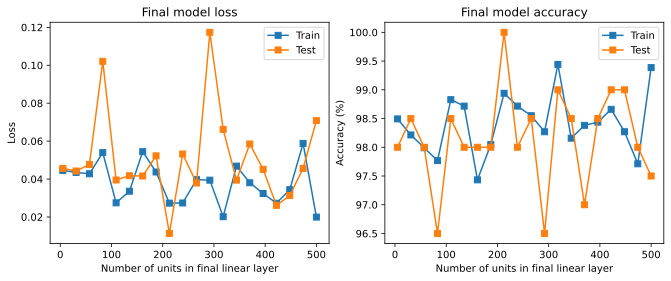

In [ ]:
fig, ax = plt.subplots(1,2,figsize=(11,4))

ax[0].plot(numberOfLinearUnits, results[:,:2], 's-')
ax[0].set_xlabel('Number of units in final linear layer')
ax[0].set_ylabel('Loss')
ax[0].set_title('Final model loss')
ax[0].legend(['Train', 'Test'])

ax[1].plot(numberOfLinearUnits, results[:,2:], 's-')
ax[1].set_xlabel('Number of units in final linear layer')
ax[1].set_ylabel('Accuracy (%)')
ax[1].set_title('Final model accuracy')
ax[1].legend(['Train', 'Test'])

plt.show()

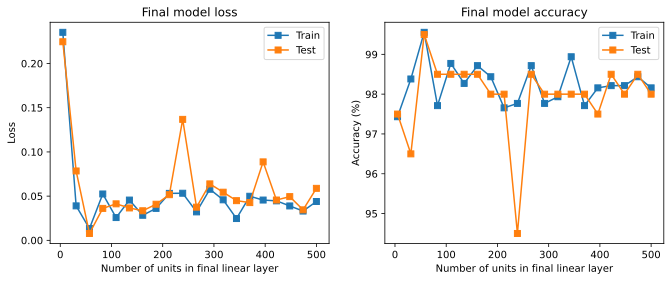

In [ ]:
fig, ax = plt.subplots(1,2,figsize=(11,4))

ax[0].plot(numberOfLinearUnits, results[:,:2], 's-')
ax[0].set_xlabel('Number of units in final linear layer')
ax[0].set_ylabel('Loss')
ax[0].set_title('Final model loss')
ax[0].legend(['Train', 'Test'])

ax[1].plot(numberOfLinearUnits, results[:,2:], 's-')
ax[1].set_xlabel('Number of units in final linear layer')
ax[1].set_ylabel('Accuracy (%)')
ax[1].set_title('Final model accuracy')
ax[1].legend(['Train', 'Test'])

plt.show()

# Do autoencoders clean Gaussians?

## Create Gaussian blurs with varying widths and occluding bars

In [5]:
nGauss = 1000
imgSize = 91

x = np.linspace(-4,4,imgSize)
X, Y = np.meshgrid(x,x)

# vary with weights smoothly
widths = np.linspace(2,20,nGauss)

# initialize tensor containing images
images = torch.zeros(nGauss, 1, imgSize, imgSize)

for i in range(nGauss):

    # create a gaussian with random centers
    ro = 1.5 * np.random.randn(2) # ro = random offset
    G = np.exp( -( (X-ro[0])**2 + (Y-ro[1])**2) / widths[i] )

    # and add noise
    G += np.random.randn(imgSize, imgSize) / 5

    # add a random bar randomly
    i1 = np.random.choice(np.arange(2,28))
    i2 = np.random.choice(np.arange(2,6))
    if np.random.randn() >0:
        G[i1:i1+i2, ] = 1
    else:
        G[: ,i1:i1+i2] = 1

    # add to the tensor
    images[i,:,:,:] = torch.tensor(G).view(1, imgSize, imgSize)

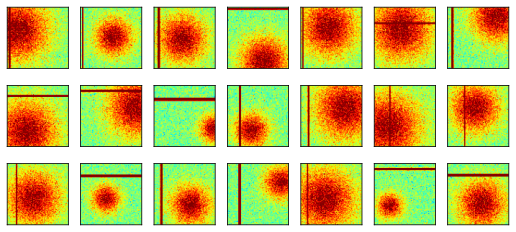

In [6]:
# visualize some images
fig, axs = plt.subplots(3,7, figsize=(9,4))

for i, ax in enumerate(axs.flatten()):
    whichpic = np.random.randint(nGauss)
    G = np.squeeze( images[whichpic, :,:])
    ax.imshow(G, vmin=-1, vmax=1, cmap='jet')
    ax.set_xticks([])
    ax.set_yticks([])

plt.show()

## Create the DL model

In [7]:
def makeTheNet():

    class gausnet(nn.Module):
        def __init__(self):
            super().__init__()

            # encoding layer
            self.enc = nn.Sequential(
                nn.Conv2d(1,6,3,padding=1),
                nn.ReLU(),
                nn.MaxPool2d(2,2),
                nn.Conv2d(6,4,3,padding=1),
                nn.ReLU(),
                nn.MaxPool2d(2,2),
            )

            # decoding layer
            self.dec = nn.Sequential(
                nn.ConvTranspose2d(4,6,3,2),
                nn.ReLU(),
                nn.ConvTranspose2d(6,1,3,2),
            )

        def forward(self, x):
            return self.dec( self.enc(x) )

    net = gausnet()
    lossfunc = nn.MSELoss()
    optimizer = torch.optim.Adam(net.parameters(), lr=.001)

    return net, lossfunc, optimizer

torch.Size([10, 1, 91, 91])


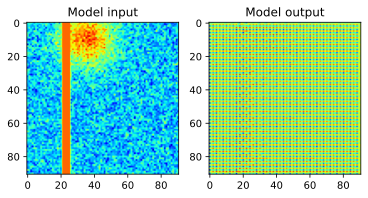

In [8]:
# test the model with one batch
net, lossfunc, optimizer = makeTheNet()

yHat = net(images[:10,:,:,:])

# check size of output
print(yHat.shape)

# let's see how they look
fig, ax = plt.subplots(1,2,figsize=(6,4))
ax[0].imshow(torch.squeeze(images[0,0,:,:]).detach(), cmap='jet')
ax[0].set_title('Model input')
ax[1].imshow(torch.squeeze(yHat[0,0,:,:]).detach(), cmap='jet')
ax[1].set_title('Model output')

plt.show()

In [9]:
# count the total number of parameters in the model
summary(net, (1,imgSize, imgSize))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1            [-1, 6, 91, 91]              60
              ReLU-2            [-1, 6, 91, 91]               0
         MaxPool2d-3            [-1, 6, 45, 45]               0
            Conv2d-4            [-1, 4, 45, 45]             220
              ReLU-5            [-1, 4, 45, 45]               0
         MaxPool2d-6            [-1, 4, 22, 22]               0
   ConvTranspose2d-7            [-1, 6, 45, 45]             222
              ReLU-8            [-1, 6, 45, 45]               0
   ConvTranspose2d-9            [-1, 1, 91, 91]              55
Total params: 557
Trainable params: 557
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.03
Forward/backward pass size (MB): 1.24
Params size (MB): 0.00
Estimated Total Size (MB): 1.27
---------------------------------------------------

## Create a function that trains the model

In [12]:
def function2trainTheModel():

    numepochs = 500

    net, lossfunc, optimizer = makeTheNet()

    losses = torch.zeros(numepochs)

    for epochi in range(numepochs):

        # pick a set of images at random
        pic2use = np.random.choice(nGauss, size=32, replace=False)
        X = images[pic2use, :,:,:]

        # forward pass and loss
        yHat = net(X)
        loss = lossfunc(yHat, X)
        losses[epochi] = loss.item()

        # backprop
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    # function output
    return losses, net

## Run the model and show the results!

In [13]:
# test the model on a bit of data
losses, net = function2trainTheModel()

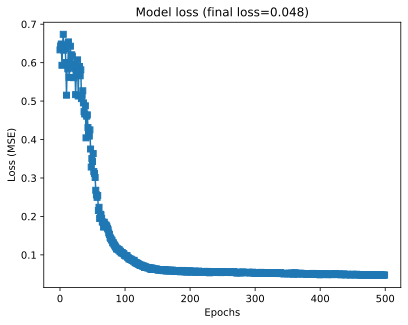

In [14]:
plt.plot(losses, 's-', label='Train')
plt.xlabel('Epochs')
plt.ylabel('Loss (MSE)')
plt.title('Model loss (final loss=%.3f)' % losses[-1])

plt.show()

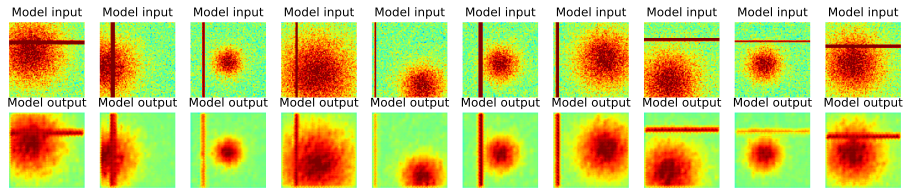

In [17]:
# visualize some images
pics2use = np.random.choice(nGauss, size=32, replace=False)
X = images[pics2use, :,:,:]
yHat = net(X)

fig, axs = plt.subplots(2,10,figsize=(16,3))

for i in range(10):
    G = torch.squeeze( X[i,0,:,:] ).detach()
    O = torch.squeeze( yHat[i,0,:,:]).detach()

    axs[0,i].imshow(G, vmin=-1, vmax=1, cmap='jet')
    axs[0,i].axis('off')
    axs[0,i].set_title('Model input')

    axs[1,i].imshow(O, vmin=-1, vmax=1, cmap='jet')
    axs[1,i].axis('off')
    axs[1,i].set_title('Model output')

plt.show()

# AEs and occluded Gaussians

In [ ]:
'''
Can an autoencoder remove the occlusion?
=> Use the non-occluded image as the "target" in the loss function.
'''

## Create Gaussian blurs with varying widths and occluding bars

In [18]:
nGauss = 1000
imgSize = 91

x = np.linspace(-4,4,imgSize)
X, Y = np.meshgrid(x,x)

# vary the widths smoothly
widths = np.linspace(2,20,nGauss)

# initialize two tensors containing images
imagesOcc = torch.zeros(nGauss, 1, imgSize, imgSize)
imagesNo = torch.zeros(nGauss, 1, imgSize, imgSize)

for i in range(nGauss):

    # create the gaussian with random centers
    ro = 1.5 * np.random.randn(2)
    G = np.exp( - ( (X-ro[0])**2 + (Y-ro[1])**2 ) / widths[i] )

    # and add noise
    G += np.random.randn(imgSize, imgSize)/5

    # add the original to the noocc
    imagesNo[i, :,:,:] = torch.Tensor(G).view(1, imgSize, imgSize)

    # add a random bar randomly
    i1 = np.random.choice(np.arange(10, imgSize-10))
    i2 = np.random.choice(np.arange(2,6))
    if np.random.randn() > 0:
        G[i1:i1+i2, ] = 1
    else:
        G[:, i1:i1+i2] = 1

    # add to the tensor with occlusion
    imagesOcc[i, :,:,:] = torch.Tensor(G).view(1, imgSize, imgSize)

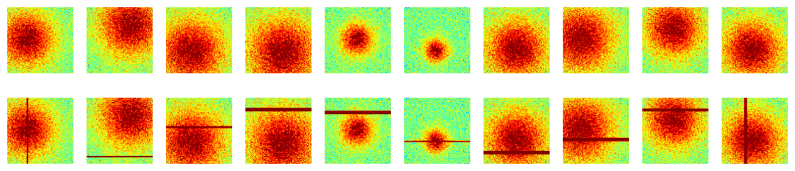

In [21]:
# visualize some images
fig, ax = plt.subplots(2,10, figsize=(14,3))

for i in range(10):
    whichpic = np.random.randint(nGauss)
    ax[0, i].imshow(np.squeeze(imagesNo[whichpic, :,:]), vmin=-1, vmax=1, cmap='jet')
    ax[0, i].set_xticks([]), ax[0, i].set_yticks([])
    ax[0, i].axis('off')

    ax[1, i].imshow(np.squeeze(imagesOcc[whichpic, :,:]), vmin=-1, vmax=1, cmap='jet')
    ax[1, i].set_xticks([]), ax[0, i].set_yticks([])
    ax[1, i].axis('off')

plt.show()

## Create the DL model

In [24]:
def makeTheNet():

    class gausnet(nn.Module):
        def __init__(self):
            super().__init__()

            # encoding layer
            self.enc = nn.Sequential(
                nn.Conv2d(1,6,3,padding=1),
                nn.ReLU(),
                nn.MaxPool2d(2,2),
                nn.Conv2d(6,4,3,padding=1),
                nn.ReLU(),
                nn.MaxPool2d(2,2)
            )

            self.dec = nn.Sequential(
                nn.ConvTranspose2d(4,6,3,2),
                nn.ReLU(),
                nn.ConvTranspose2d(6,1,3,2),
            )

        def forward(self, x):
            return self.dec( self.enc(x) )

    net = gausnet()
    lossfunc = nn.MSELoss()
    optimizer = torch.optim.Adam(net.parameters(), lr=.001)

    return net, lossfunc, optimizer

torch.Size([10, 1, 91, 91])


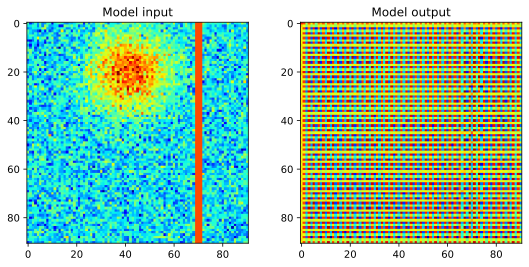

In [25]:
# test the model with one batch
net, lossfunc, optimizer = makeTheNet()

yHat = net(imagesOcc[:10, :,:,:])

# check size of output
print(yHat.shape)

# let's see how they look
fig, ax = plt.subplots(1,2,figsize=(9,4))
ax[0].imshow(torch.squeeze(imagesOcc[0,0,:,:]).detach(), cmap='jet')
ax[0].set_title('Model input')
ax[1].imshow(torch.squeeze(yHat[0,0,:,:]).detach(), cmap='jet')
ax[1].set_title('Model output')

plt.show()

## Create a function that trains the model

In [28]:
def function2trainTheModel():

    numepochs = 1000

    net, lossfunc, optimizer = makeTheNet()

    losses = torch.zeros(numepochs)

    for epochi in range(numepochs):

        # pick a set of images at random
        pics2use = np.random.choice(nGauss, size=32, replace=False)

        # get the input (has occlusions) and the target (no occlusions)
        X = imagesOcc[pics2use, :,:,:]
        Y = imagesNo[pics2use, :,:,:]

        # forward pass and loss
        yHat = net(X)
        loss = lossfunc(yHat, Y)
        losses[epochi] = loss.item()

        # backprop
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    return losses, net

## Run the model and show the results!

In [29]:
# test the model on a bit of data
losses, net = function2trainTheModel()

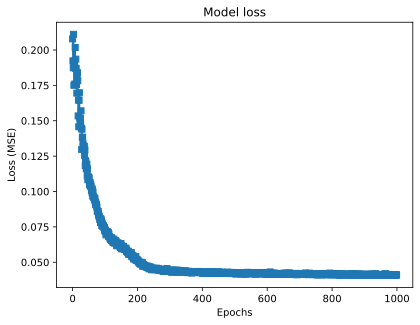

In [30]:
plt.plot(losses, 's-', label='Train')
plt.xlabel('Epochs')
plt.ylabel('Loss (MSE)')
plt.title('Model loss')

plt.show()

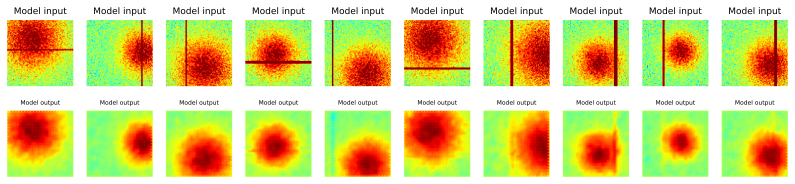

In [34]:
# visualize some images
pics2use = np.random.choice(nGauss, size=32, replace=False)
X = imagesOcc[pics2use, :,:,:]
yHat = net(X)

fig, axs = plt.subplots(2,10, figsize=(14,3))

for i in range(10):

    G = torch.squeeze( X[i,0,:,:] ).detach()
    O = torch.squeeze( yHat[i,0,:,:] ).detach()

    axs[0,i].imshow(G, vmin=-1, vmax=1, cmap='jet')
    axs[0,i].axis('off')
    axs[0,i].set_title('Model input', fontsize=9)

    axs[1,i].imshow(O, vmin=-1, vmax=1, cmap='jet')
    axs[1,i].axis('off')
    axs[1,i].set_title('Model output', fontsize=6)

plt.show()

# Custom loss functions

## Create Gaussian with varying widths

In [8]:
nGauss = 1000
imgSize = 91

x = np.linspace(-4,4,imgSize)
X, Y = np.meshgrid(x,x)

widths = np.linspace(2,20,nGauss)

images = torch.zeros(nGauss, 1, imgSize, imgSize)

for i in range(nGauss):

    ro = 1.5 * np.random.randn(2)
    G = np.exp( -( (X-ro[0])**2 + (Y-ro[1])**2 ) / widths[i] )

    G += np.random.randn(imgSize, imgSize)/5

    images[i, :,:,:] = torch.Tensor(G).view(1,imgSize, imgSize)

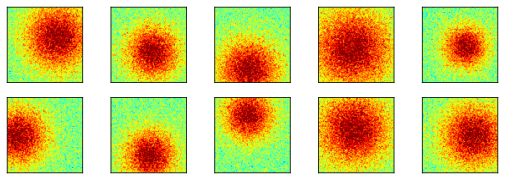

In [10]:
# visualize some images
fig, axs = plt.subplots(2,5, figsize=(9,3))

for i, ax in enumerate(axs.flatten()):
    whichpic = np.random.randint(nGauss)
    G = np.squeeze(images[whichpic, :,:])
    ax.imshow(G, vmin=-1, vmax=1, cmap='jet')
    ax.set_xticks([])
    ax.set_yticks([])
plt.show()

## Custom loss functions

In [11]:
# L1 loss function

class myL1Loss(nn.Module):
    def __init__(self):
        super().__init__()

    def forward(self, yHat, y):
        l = torch.mean( torch.abs(yHat-y) )
        return l

# L2 + average loss function

class myL2AveLoss(nn.Module):
    def __init__(self):
        super().__init__()

    def forward(self, yHat, y):
        # MSE part
        l = torch.mean( (yHat-y)**2 )

        # average part
        a =  torch.abs( torch.mean(yHat) )

        # sum together
        return l + a

# correlation loss function
class myCorrLoss(nn.Module):
    def __init__(self):
        super().__init__()

    def forward(self, yHat, y):

        meanx = torch.mean(yHat)
        meany = torch.mean(y)

        num = torch.sum( (yHat-meanx)*(yHat-meany) )
        den = (torch.numel(y)-1) * torch.std(yHat) * torch.std(y)
        return -num / den

## Create the DL model

In [27]:
def makeTheNet(lossfunc):

    class gausnet(nn.Module):
        def __init__(self):
            super().__init__()

            # encoding layer
            self.enc = nn.Sequential(
                nn.Conv2d(1,6,3,padding=1),
                nn.ReLU(),
                nn.MaxPool2d(2,2),
                nn.Conv2d(6,4,3,padding=1),
                nn.ReLU(),
                nn.MaxPool2d(2,2)
            )

            self.dec = nn.Sequential(
                nn.ConvTranspose2d(4,6,3,2),
                nn.ReLU(),
                nn.ConvTranspose2d(6,1,3,2)
            )

        def forward(self, x):
            return self.dec( self.enc(x) )

    net = gausnet()

    if lossfunc == 'l1':
        lossfunc = myL1Loss()
    elif lossfunc == 'l2':
        lossfunc = myL2AveLoss()
    elif lossfunc == 'corr':
        lossfunc = myCorrLoss()
    else:
        lossfunc = nn.MSELoss()

    optimizer = torch.optim.Adam(net.parameters(), lr=.001)

    return net, lossfunc, optimizer

# Create a function that trains the model

In [28]:
def function2trainTheModel(func):

    numepochs = 1000

    net, lossfunc, optimizer = makeTheNet(func)

    losses = torch.zeros(numepochs)

    for epochi in range(numepochs):

        # pick a set of images at random
        pics2use = np.random.choice(nGauss, size=32, replace=False)
        X = images[pics2use, :,:,:]

        # forward pass and loss
        yHat = net(X)
        loss = lossfunc(yHat, X)
        losses[epochi] = loss.item()

        # backprop
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    return losses, net

## Run the model and show the results!

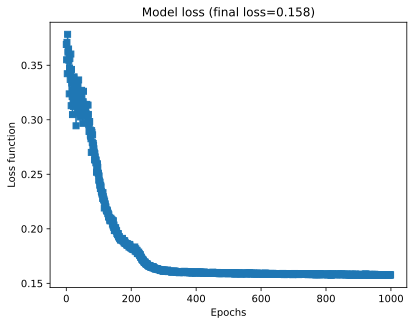

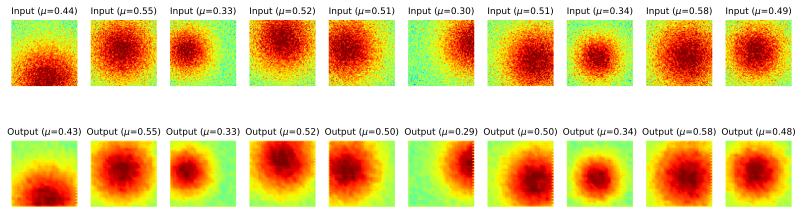

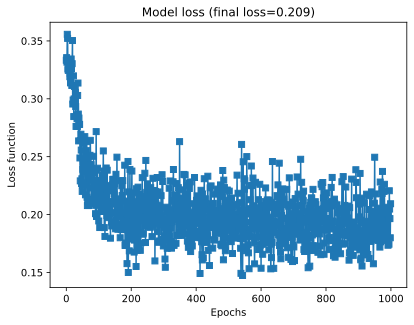

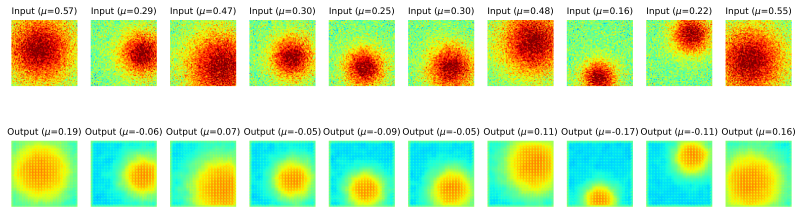

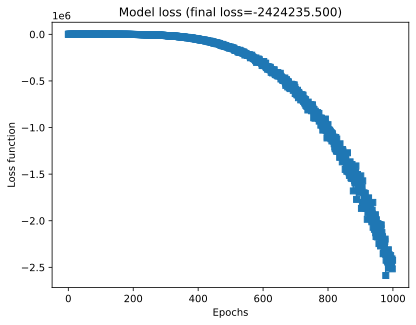

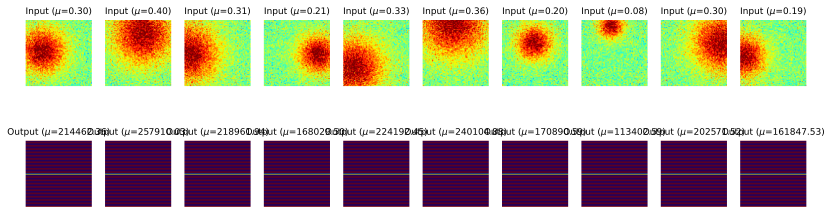

In [29]:
lossfuncs = ['l1', 'l2', 'corr']

for i in range(len(lossfuncs)):

    # train the model!
    losses, net = function2trainTheModel(lossfuncs[i])

    # plot
    plt.plot(losses, 's-', label='Train')
    plt.xlabel('Epochs')
    plt.ylabel('Loss function')
    plt.title('Model loss (final loss=%.3f)' % losses[-1])

    plt.show()

    # visualize some images
    pics2use = np.random.choice(nGauss, size=32, replace=False)
    X = images[pics2use, :,::]
    yHat = net(X)

    fig, axs = plt.subplots(2,10,figsize=(14,4))
    for i in range(10):

        G = torch.squeeze( X[i,0,:,:]).detach()
        O = torch.squeeze( yHat[i,0,:,:]).detach()

        axs[0,i].imshow(G, vmin=-1, vmax=1, cmap='jet')
        axs[0,i].axis('off')
        axs[0,i].set_title('Input ($\mu$=%.2f)' % torch.mean(G).item(), fontsize=9)

        axs[1,i].imshow(O, vmin=-1, vmax=1, cmap='jet')
        axs[1,i].axis('off')
        axs[1,i].set_title('Output ($\mu$=%.2f)' % torch.mean(O).item(), fontsize=9)
    plt.show()

# Discover the Gaussian parameters

In [ ]:
'''
* Create a network that will learn parameters of a model.
* Why DL might have an important role in the future of inferential statistics.

The way that when we normally think about the data, is that
There are underlying parameters in the universe, that cause the world to be the way it is.
And therefore create the data with certain distribution.

What do we do with these data?
- Two ways we use the data.
1) Extract diagnostic features in order to predict some output or categorize the data
=> That's we typically use in Deep learning for (ML in general).
=> The goal here is to learn features of the data that can help us predict real world outcomes.

2) Try to uncover the parameters that initially created data.
=> Estimate of parameters: Best guess what the parameters are given what we have measured in the data.
=> Goal of Statistics.
=> Inferential statistics we are trying to understand the parameters of the world that created the data.

'''

In [29]:
''' DL vs. statistics

- Deep learning is mainly focused on categorization based on observd features, which may not reflect the generating parameters.
- Estimating population parameters is the purview of statistics.
- But DL can be used to estimate parameters.
- With simulated data we can do this via supervised learning;
  unsupervised parameter learning is called variational autoencoding.

'''

In [ ]:
'''
Train the network to learn three parameters (X,Y,r).
Test on unseen Gaussians (no parameters given).
'''

## Create Gaussian blurs with different widths

In [32]:
nGauss = 1000
imgSize = 91

x = np.linspace(-4,4,imgSize)
X, Y = np.meshgrid(x,x)

# initialize tensors containing images and labels
images = torch.zeros(nGauss, 1, imgSize, imgSize)
labels = torch.zeros(nGauss, 3)

for i in range(nGauss):

    # location and width parameters
    loc = 2*np.random.randn(2)
    wid = np.random.rand()*10 + 5

    # create the gaussian with random centers
    G = np.exp( -( (X-loc[0])**2 + (Y-loc[1])**2 )  / wid )
    G += np.random.randn(imgSize, imgSize) / 10

    # add to the tensor
    images[i,:,:,:] = torch.Tensor(G).view(1,imgSize, imgSize)
    labels[i,:] = torch.Tensor( [loc[0], loc[1], wid] )

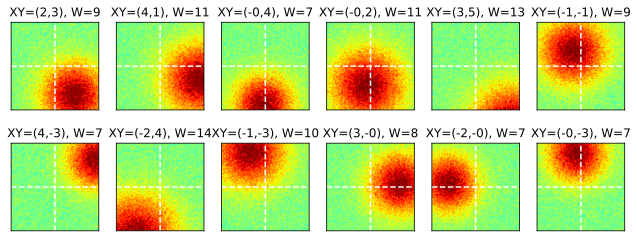

In [36]:
# visualize some images
fig, axs = plt.subplots(2,6,figsize=(11,4))

for i, ax in enumerate(axs.flatten()):
    whichpic = np.random.randint(nGauss)
    G = np.squeeze( images[whichpic, :,:])
    ax.imshow(G, vmin=-1, vmax=1, cmap='jet', extent=[-4,4,-4,4], origin='upper')
    ax.set_title(f'XY=({labels[whichpic, 0]:.0f},{labels[whichpic, 1]:.0f}), W={labels[whichpic, 2]:.0f}')
    ax.plot([-4,4],[0,0], 'w--')
    ax.plot([0,0],[-4,4], 'w--')
    ax.set_xticks([])
    ax.set_yticks([])

# plt.tight_layout()
plt.show()

## Create train/test groups using DataLoader

In [37]:
train_data, test_data, train_labels, test_labels = train_test_split(images, labels, test_size=.1)

trainset = TensorDataset(train_data, train_labels)
testset = TensorDataset(test_data, test_labels)

batchsize=16
train_loader = DataLoader(trainset, batch_size=batchsize, shuffle=True, drop_last=True)
test_loader = DataLoader(testset, batch_size=testset.tensors[0].shape[0])

In [38]:
# check size (should be images X channels X width X height)
print(train_loader.dataset.tensors[0].shape)
print(train_loader.dataset.tensors[1].shape)

torch.Size([900, 1, 91, 91])
torch.Size([900, 3])


## Create the DL model

In [39]:
def makeTheNet():

    class gausnet(nn.Module):
        def __init__(self):
            super().__init__()

            # all layers in one go using nn.Sequential
            self.enc = nn.Sequential(

                                     # conv/pool block 1
                                     nn.Conv2d(1,6,3,padding=1),                # output size: (91 + 2*1 - 3)/1 + 1 = 91
                                     nn.ReLU(),
                                     nn.AvgPool2d(2,2),                                # output size: 91 / 2 = 45

                                     # conv/pool block 2
                                     nn.Conv2d(6,4,3,padding=1),                # output size: (45 + 2*1 - 3)/1 + 1 = 45
                                     nn.ReLU(),
                                     nn.AvgPool2d(2,2),                                # output size: 45 / 2 = 22

                                     # linear decision layer
                                     nn.Flatten(),                                           # vectorize conv2 block output
                                     nn.Linear(22*22*4, 50),                         # output size: 50
                                     nn.Linear(50,3)                                      # output size: 3
            )

        def forward(self, x):
            return self.enc(x)

    net = gausnet()
    lossfunc = nn.MSELoss()
    optimizer = torch.optim.Adam(net.parameters(), lr=.001)

    return net, lossfunc, optimizer

In [40]:
# test the model with one batch
net, lossfunc, optimizer = makeTheNet()

X, y = next(iter(train_loader))
yHat = net(X)

# check size of output
print(yHat)
print(yHat.shape)

# now let's compute the loss
loss = lossfunc(yHat, y)
print()
print('Loss:')
print(loss)

tensor([[-0.0252, -0.0956,  0.0540],
        [-0.0253, -0.0983,  0.0653],
        [-0.0480, -0.1071,  0.0430],
        [-0.0450, -0.0948,  0.0604],
        [-0.0280, -0.0977,  0.0726],
        [-0.0286, -0.0974,  0.0686],
        [-0.0308, -0.0950,  0.0514],
        [-0.0197, -0.0974,  0.0527],
        [-0.0418, -0.0933,  0.0545],
        [-0.0382, -0.0913,  0.0597],
        [-0.0330, -0.0967,  0.0545],
        [-0.0290, -0.0915,  0.0533],
        [-0.0374, -0.0903,  0.0569],
        [-0.0459, -0.1026,  0.0508],
        [-0.0417, -0.0885,  0.0570],
        [-0.0199, -0.0971,  0.0671]], grad_fn=<AddmmBackward0>)
torch.Size([16, 3])

Loss:
tensor(29.8065, grad_fn=<MseLossBackward0>)


In [41]:
# count the total number of parameters in the model
summary(net, (1, imgSize, imgSize))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1            [-1, 6, 91, 91]              60
              ReLU-2            [-1, 6, 91, 91]               0
         AvgPool2d-3            [-1, 6, 45, 45]               0
            Conv2d-4            [-1, 4, 45, 45]             220
              ReLU-5            [-1, 4, 45, 45]               0
         AvgPool2d-6            [-1, 4, 22, 22]               0
           Flatten-7                 [-1, 1936]               0
            Linear-8                   [-1, 50]          96,850
            Linear-9                    [-1, 3]             153
Total params: 97,283
Trainable params: 97,283
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.03
Forward/backward pass size (MB): 1.00
Params size (MB): 0.37
Estimated Total Size (MB): 1.41
---------------------------------------------

## Create a function that trains the model

In [42]:
def function2trainTheModel():

    numepochs = 30

    net, lossfunc, optimizer = makeTheNet()

    trainLoss = torch.zeros(numepochs)
    testLoss = torch.zeros(numepochs)

    for epochi in range(numepochs):

        batchLoss = []
        for X, y in train_loader:
            yHat = net(X)
            loss = lossfunc(yHat, y)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            batchLoss.append(loss.item())

        trainLoss[epochi] = np.mean(batchLoss)

        X, y = next(iter(test_loader))
        with torch.no_grad():
            yHat = net(X)
            loss = lossfunc(yHat, y)

        testLoss[epochi] = loss.item()

    return trainLoss, testLoss, net

## Run the model and show the results!

In [43]:
trainLoss, testLoss, net = function2trainTheModel()

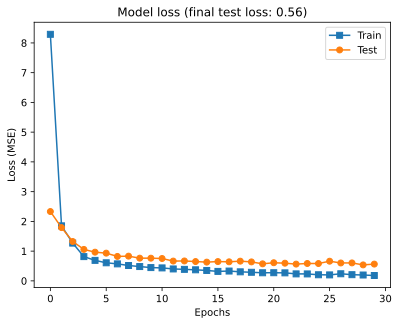

In [44]:
plt.plot(trainLoss, 's-', label='Train')
plt.plot(testLoss, 'o-', label='Test')
plt.xlabel('Epochs')
plt.ylabel('Loss (MSE)')
plt.legend()
plt.title('Model loss (final test loss: %.2f)' %testLoss[-1])

plt.show()

<ipython-input-50-c0e5ddfaccac>:23: RuntimeWarning: invalid value encountered in sqrt
  x = cx + np.cos(th) * np.sqrt(rd)
<ipython-input-50-c0e5ddfaccac>:24: RuntimeWarning: invalid value encountered in sqrt
  y = cy + np.sin(th) * np.sqrt(rd)


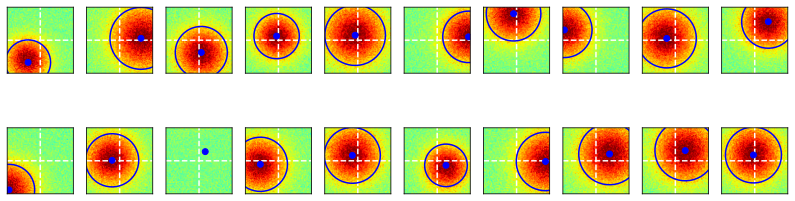

In [50]:
# visualize some images
X, Y = next(iter(test_loader))
yHat = net(X)

fig, axs = plt.subplots(2,10,figsize=(14,4))

th = np.linspace(0, 2*np.pi)

for i, ax in enumerate(axs.flatten()):

    # get the Gaussian and draw it, and draw the white guide-line
    G = torch.squeeze( X[i,0,:,:] ).detach()
    ax.imshow(G, vmin=-1, vmax=1, cmap='jet', extent=[-4,4,-4,4], origin='lower')
    ax.plot([-4,4],[0,0], 'w--')
    ax.plot([0,0], [-4,4], 'w--')

    # compute the model's prediction
    cx = yHat[i][0].item()
    cy = yHat[i][1].item()
    rd = yHat[i][2].item()

    # and draw it
    x = cx + np.cos(th) * np.sqrt(rd)
    y = cy + np.sin(th) * np.sqrt(rd)
    ax.plot(x,y,'b')
    ax.plot(cx,cy, 'bo')

    # some final plotting niceties
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlim([-4,4])
    ax.set_ylim([-4,4])

plt.show()

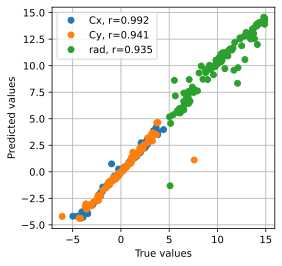

In [49]:
fig = plt.figure(figsize=(4,4))

paramNames = ['Cx', 'Cy', 'rad']

for i in range(3):

    # extract parameters and compute correlation
    yy = Y[:,i].detach()
    yh = yHat[:,i].detach()
    cr = np.corrcoef(yy, yh)[0,1]

    # plot with label
    plt.plot(yy, yh, 'o', label=f'{paramNames[i]}, r={cr:.3f}')

plt.legend()
plt.xlabel('True values')
plt.ylabel('Predicted values')
plt.grid()
plt.show()

# The EMNIST dataset (letter recognition)

## Import and inspect the data

In [3]:
# download the dataset
cdata = torchvision.datasets.EMNIST(root='emnist', split='letters', download=True)

# inspect the data
print(cdata.classes)
print(str(len(cdata.classes)) + ' classes')

100%|██████████| 561753746/561753746 [00:26<00:00, 21306296.33it/s]


Extracting emnist/EMNIST/raw/gzip.zip to emnist/EMNIST/raw
['N/A', 'a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j', 'k', 'l', 'm', 'n', 'o', 'p', 'q', 'r', 's', 't', 'u', 'v', 'w', 'x', 'y', 'z']
27 classes


In [53]:
print('Data size:')
print(cdata.data.shape)

Data size:
torch.Size([124800, 28, 28])


In [4]:
# transform to 4D tensor for conv layers (and transform from int8 to float)
images = cdata.data.view([124800,1,28,28]).float()
print('\nTensor data:')
print(images.shape)


Tensor data:
torch.Size([124800, 1, 28, 28])


In [54]:
# brief aside: class 'N/A' doesn't exist in the data
print(torch.sum(cdata.targets==0))

tensor(0)


In [55]:
# However, it causes problems in one-hot encoding...
torch.unique(cdata.targets)

tensor([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18,
        19, 20, 21, 22, 23, 24, 25, 26])

In [56]:
cdata.class_to_idx

{'N/A': 0,
 'a': 1,
 'b': 2,
 'c': 3,
 'd': 4,
 'e': 5,
 'f': 6,
 'g': 7,
 'h': 8,
 'i': 9,
 'j': 10,
 'k': 11,
 'l': 12,
 'm': 13,
 'n': 14,
 'o': 15,
 'p': 16,
 'q': 17,
 'r': 18,
 's': 19,
 't': 20,
 'u': 21,
 'v': 22,
 'w': 23,
 'x': 24,
 'y': 25,
 'z': 26}

In [5]:
# so therefore we'll eliminate it and subtract 1 from the original

# remove the first class category
letterCategories = cdata.classes[1:]

# relabel labels to start at 0
labels = copy.deepcopy(cdata.targets) - 1
print(labels.shape)

print(torch.sum(labels==0))
torch.unique(labels)

torch.Size([124800])
tensor(4800)


tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20, 21, 22, 23, 24, 25])

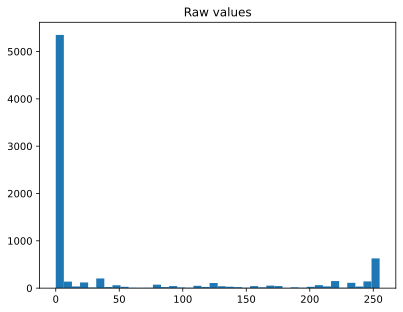

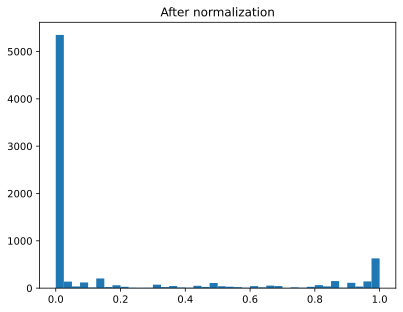

In [6]:
# next issue: do we need to normalize the images?
plt.hist(images[:10,:,:,:].view(1,-1).detach(), 40);
plt.title('Raw values')
plt.show()

# yarp.
images /= torch.max(images)

plt.hist(images[:10,:,:,:].view(1,-1).detach(), 40);
plt.title('After normalization')
plt.show()

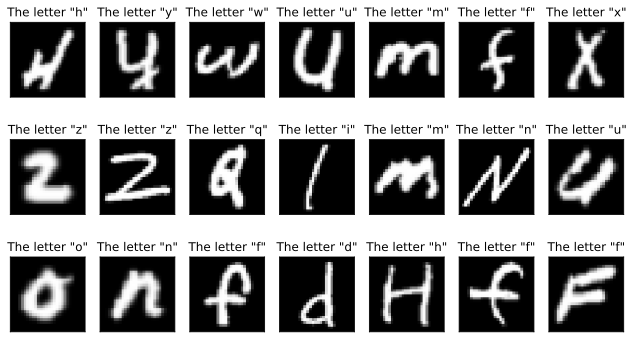

In [63]:
# visualize some images
fig, axs = plt.subplots(3,7,figsize=(11,6))

for i, ax in enumerate(axs.flatten()):

    # pick a random pic
    whichpic = np.random.randint(images.shape[0])

    # extract the image and its target letter
    I = np.squeeze( images[whichpic,:,:] )
    letter = letterCategories[labels[whichpic]]

    # visualize
    ax.imshow(I.T, cmap='gray')
    ax.set_title('The letter "%s"' %letter)
    ax.set_xticks([])
    ax.set_yticks([])
plt.show()

## Create train/test groups using DataLoader

In [7]:
train_data, test_data, train_labels, test_labels = train_test_split(images, labels, test_size=.1)

trainset = TensorDataset(train_data, train_labels)
testset = TensorDataset(test_data, test_labels)

batchsize=32
train_loader = DataLoader(trainset, batch_size=batchsize, shuffle=True, drop_last=True)
test_loader = DataLoader(testset, batch_size=testset.tensors[0].shape[0])

In [65]:
# check size (should be images X channels X width X height)
print(train_loader.dataset.tensors[0].shape)
print(train_loader.dataset.tensors[1].shape)

torch.Size([112320, 1, 28, 28])
torch.Size([112320])


## Create the DL model

In [8]:
def makeTheNet(print_toggle=False):

    class emnistnet(nn.Module):
        def __init__(self, print_toggle):
            super().__init__()

            # print toggle
            self.print = print_toggle

            # --------------- feature map layers ----------------- #
            # first convolution layer
            self.conv1 = nn.Conv2d(1,6,3,padding=1)
            self.bnorm1 = nn.BatchNorm2d(6)                 # input the number of channels in this layer
            # output size: (28 + 2*1 - 3)/1 + 1 = 28 / 2 = 14 (maxpool)

            # second convolution layer
            self.conv2 = nn.Conv2d(6,6,3,padding=1)
            self.bnorm2 = nn.BatchNorm2d(6)                 # input the number of channels in this layer
            # output size: (14 + 2*1 - 3)/1 + 1 = 14 / 2 = 7 (maxpool)

            # --------------- linear decision layers ----------------- #
            self.fc1 = nn.Linear(7*7*6, 50)
            self.fc2 = nn.Linear(50, 26)

        def forward(self, x):

            if self.print: print(f'Input: {x.shape}')

            # first block: convolution -> maxpool -> batchnorm -> relu
            x = F.max_pool2d( self.conv1(x), 2 )
            x = F.leaky_relu( self.bnorm1(x) )
            if self.print: print(f'First CPR block: {x.shape}')

            # first block: convolution -> maxpool -> batchnorm -> relu
            x = F.max_pool2d( self.conv2(x), 2 )
            x = F.leaky_relu( self.bnorm2(x) )
            if self.print: print(f'Second CPR block: {x.shape}')

            # reshape for linear layer
            nUnits = x.shape.numel() / x.shape[0]
            x = x.view(-1, int(nUnits))
            if self.print: print(f'Vectorized: {list(x.shape)}')

            # linear layers
            x = F.leaky_relu(self.fc1(x))
            x = self.fc2(x)
            if self.print: print(f'Final output: {x.shape}')

            return x

    net = emnistnet(print_toggle)
    lossfunc = nn.CrossEntropyLoss()
    optimizer = torch.optim.Adam(net.parameters(), lr=.001)

    return net, lossfunc, optimizer

In [68]:
# test the model with one batch
net, lossfunc, optimizer = makeTheNet(True)

X, y = next(iter(train_loader))
yHat = net(X)

# check size of output
print('\nOutput size:')
print(yHat.shape)

# now let's compute the loss
loss = lossfunc(yHat, torch.squeeze(y))
print('\nLoss:')
print(loss)

Input: torch.Size([32, 1, 28, 28])
First CPR block: torch.Size([32, 6, 14, 14])
Second CPR block: torch.Size([32, 6, 7, 7])
Vectorized: [32, 294]
Final output: torch.Size([32, 26])

Output size:
torch.Size([32, 26])

Loss:
tensor(3.3078, grad_fn=<NllLossBackward0>)


## Create a function that trains the model

In [12]:
def function2trainTheModel():

    numepochs = 10

    # create a new model
    net, lossfunc, optimizer = makeTheNet()

    # send the model to the GPU
    net.to(device)

    # initialize losses
    trainLoss = torch.zeros(numepochs)
    testLoss = torch.zeros(numepochs)
    trainErr = torch.zeros(numepochs)
    testErr = torch.zeros(numepochs)

    # loop over epochs
    for epochi in range(numepochs):

        # loop over training data batches
        net.train()

        batchLoss = []
        batchErr = []
        for X, y in train_loader:

            # push data to GPU
            X = X.to(device)
            y = y.to(device)

            # forward pass and loss
            yHat = net(X)
            loss = lossfunc(yHat, y)

            # backprop
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            # loss and error from this batch
            batchLoss.append(loss.item())
            batchErr.append(100 * torch.mean((torch.argmax(yHat, axis=1)!=y).float()).item() )
        # end of batch loop ...

        # and get average losses and error rates across the batches
        trainLoss[epochi] = np.mean(batchLoss)
        trainErr[epochi] = np.mean(batchErr)

        # test performance
        net.eval()
        X, y = next(iter(test_loader))

        # push data to GPU
        X = X.to(device)
        y = y.to(device)

        with torch.no_grad():
            yHat = net(X)
            loss = lossfunc(yHat, y)

        # get loss and error rate from the test batch
        testLoss[epochi] = loss.item()
        testErr[epochi] = 100 * torch.mean((torch.argmax(yHat, axis=1)!=y).float()).item()
    # end epochs

    # function output
    return trainLoss, testLoss, trainErr, testErr, net

## Run the model and show the results!

In [13]:
trainLoss, testLoss, trainErr, testErr, net = function2trainTheModel()

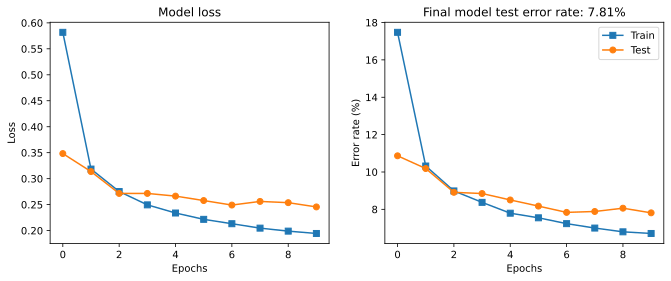

In [14]:
fig, ax = plt.subplots(1,2,figsize=(11,4))

ax[0].plot(trainLoss, 's-', label='Train')
ax[0].plot(testLoss, 'o-', label='Test')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Loss')
ax[0].set_title('Model loss')

ax[1].plot(trainErr, 's-', label='Train')
ax[1].plot(testErr, 'o-', label='Test')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Error rate (%)')
ax[1].set_title(f'Final model test error rate: {testErr[-1]:.2f}%')
ax[1].legend()

plt.show()

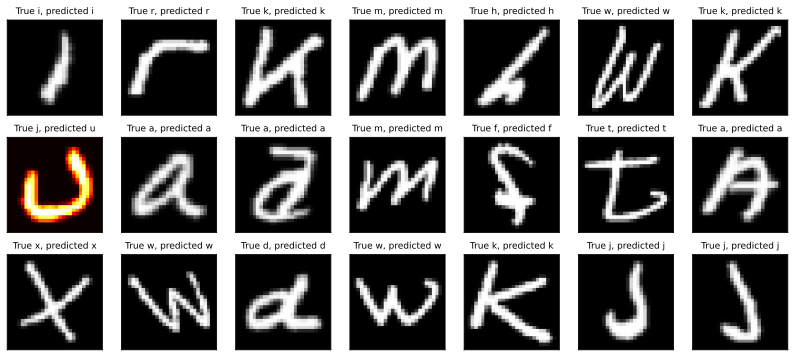

In [15]:
# visualize some images

X, y = next(iter(test_loader))
X = X.to(device)
y = y.to(device)
yHat = net(X)

# pick some examples at random to show
rand_idx = np.random.choice(len(y), size=21, replace=False)

# visualize some images
fig, axs = plt.subplots(3,7,figsize=(14,6))

for i, ax in enumerate(axs.flatten()):

    # extract the image and its target letter
    I = np.squeeze( X[rand_idx[i], 0,:,:] ).cpu()
    trueLetter = letterCategories[ y[rand_idx[i]] ]
    predLetter = letterCategories[ torch.argmax(yHat[rand_idx[i], :]) ]

    # color-code the accuracy (using ternary operator)
    col = 'gray' if trueLetter==predLetter else 'hot'

    # visualize
    ax.imshow(I.T, cmap=col)
    ax.set_title('True %s, predicted %s' %(trueLetter, predLetter), fontsize=9)
    ax.set_xticks([])
    ax.set_yticks([])

plt.show()

## Accuracy by letter

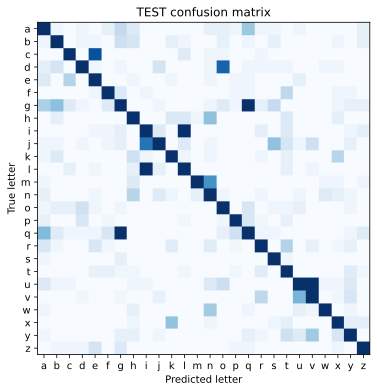

In [17]:
# compute the confusion matrix
C = skm.confusion_matrix(y.cpu(), torch.argmax(yHat.cpu(), axis=1), normalize='true')

# visualize it
fig = plt.figure(figsize=(6,6))
plt.imshow(C, 'Blues', vmax=.05)

# make the plot look nicer
plt.xticks(range(26), labels=letterCategories)
plt.yticks(range(26), labels=letterCategories)
plt.title('TEST confusion matrix')
plt.ylabel('True letter')
plt.xlabel('Predicted letter')
plt.show()

# Dropout in CNNs

In [ ]:
'''
* In which layers to apply dropout.
* Why dropout actually has different effects in convolution vs. fully-connected layers.

* Dropout in convolution vs. fully-connected layers
- Dropout means that units learn to be independent of each other.
- But dependence is the entire purpose of the kernel weights in a convolutional layer!
- Thus, strong dropout (p=.5) in convolutional layers might prevent learning spatial dependencies.
- Some dropout (p=.1-.2) regularizes by adding noise.

* What and how much to dropout

1) Dropout: A Simple Way to Prevent Neural Networks from Overfitting

- Dropout was applied to all the layers of the network with the probability of retaining a hidden unit being p=(.9, .75, .75, .5, .5, .5)
  for the different layers of the network.
- The best performing convolutional nets that do not use dropout achieve an error rate of 3.95%.
- Adding dropout only to the fully connected layers reduces the error to 3.02%.
- Adding dropout to the convolutional layers as well further reduces the error to 2.55%.
- The additional gain in performance obtained by adding dropout in the convolutional layers (3.02% to 2.55%) is worth noting.
- Dropout in the lower layers still helps because it provides noisy inputs for the higher fully connected layers which prevents
  them from overfitting.

2) Improving neural networks by preventing co-adaptation of feature detectors

- One important consequence of this convolutional shared-filter architecture is a drastic reduction in the number of parameters
  relative to a neural net in which all neurons apply different filters.
- This reduces the net's representational capacity,
  but it also reduces its capacity to overfit, so dropout is far less advantageous in convolutional layers.

=> Conclusion
1) In the convolutional layers: A little bit (.1~.25) because it adds noise.
2) Fully connected layers: More (.5) because it encourages independence.

'''

# EMNIST categorization - Beat performance!

In [ ]:
''' Recommend options to consider
- Number of layers
- Kernel size
- Number of filters/units
- Batch normalization
- Train/test split
- Dropout
- L1/2 regularization
- Data transforms/augmentation
'''

## Import and inspect the data

In [3]:
cdata = torchvision.datasets.EMNIST(root='emnist', split='letters', download=True)

images = cdata.data.view([124800, 1, 28,28]).float()
images /= torch.max(images)

letterCategories = cdata.classes[1:]
labels = copy.deepcopy(cdata.targets)-1

100%|██████████| 561753746/561753746 [00:07<00:00, 79515222.95it/s] 


Extracting emnist/EMNIST/raw/gzip.zip to emnist/EMNIST/raw


## Create train/test groups using DataLoader

In [4]:
train_data, test_data, train_labels, test_labels = train_test_split(images, labels, test_size=.05)

trainset = TensorDataset(train_data, train_labels)
testset = TensorDataset(test_data, test_labels)

batchsize=32
train_loader = DataLoader(trainset, batch_size=batchsize, shuffle=True, drop_last=True)
test_loader = DataLoader(testset, batch_size=testset.tensors[0].shape[0])

In [5]:
print(train_loader.dataset.tensors[0].shape)
print(train_loader.dataset.tensors[1].shape)
print(test_loader.dataset.tensors[0].shape)
print(test_loader.dataset.tensors[1].shape)

torch.Size([118560, 1, 28, 28])
torch.Size([118560])
torch.Size([6240, 1, 28, 28])
torch.Size([6240])


## Create the DL model

In [6]:
def makeTheNet(print_toggle=False):

    class emnistnet(nn.Module):
        def __init__(self, print_toggle):
            super().__init__()

            self.print = print_toggle

            # --------------------- feature map layers --------------------- #
            # first convolution layer
            self.conv1 = nn.Conv2d(1,64,3,padding=1)
            self.bnorm1 = nn.BatchNorm2d(64)               # input the number of channels in this layer
            # output size: (28 + 2*1 - 3)/1 + 1 = 28 / 2 = 14 (maxpool)

            # second convolution layer
            self.conv2 = nn.Conv2d(64, 128, 3)
            self.bnorm2 = nn.BatchNorm2d(128)             # input the number of channels in this layer
            # output size: (14 + 2*0 - 3)/1 + 1 = 12 / 2 = 6 (maxpool)

            # third convolution layer
            self.conv3 = nn.Conv2d(128, 256, 3)
            self.bnorm3 = nn.BatchNorm2d(256)             # input the number of channels in this layer
            # output size: (6 + 2*0 - 3)/1 + 1 = 4 / 2 = 2 (maxpool)

            # --------------------- linear decision layers --------------------- #
            self.fc1 = nn.Linear(2*2*256, 256)
            self.fc2 = nn.Linear(256, 64)
            self.fc3 = nn.Linear(64, 26)

        def forward(self, x):

            if self.print: print(f'Input: {x.shape}')

            # first block (convolution -> maxpool -> batchnorm -> relu & dropout)
            x = F.max_pool2d(self.conv1(x), 2)
            x = F.leaky_relu(self.bnorm1(x))
            x = F.dropout(x, p=.25, training=self.training)
            if self.print: print(f'First block: {list(x.shape)}')

            # second block (convolution -> maxpool -> batchnorm -> relu)
            x = F.max_pool2d(self.conv2(x), 2)
            x = F.leaky_relu(self.bnorm2(x))
            x = F.dropout(x, p=.25, training=self.training)
            if self.print: print(f'Second block: {list(x.shape)}')

            # third block (convolution -> maxpool -> batchnorm -> relu)
            x = F.max_pool2d(self.conv3(x), 2)
            x = F.leaky_relu(self.bnorm3(x))
            x = F.dropout(x, p=.25, training=self.training)
            if self.print: print(f'Third block: {list(x.shape)}')

            # reshape for linear layer
            nUnits = x.shape.numel() / x.shape[0]
            x = x.view(-1, int(nUnits))
            if self.print: print(f'Vectorized: {list(x.shape)}')

            # linear layers
            x = F.leaky_relu(self.fc1(x))
            x = F.dropout(x, p=.5, training=self.training)
            x = F.leaky_relu(self.fc2(x))
            x = F.dropout(x, p=.5, training=self.training)
            x = self.fc3(x)
            if self.print: print(f'Final output: {list(x.shape)}')

            return x

    # create the model instance
    net = emnistnet(print_toggle)

    # loss function
    lossfunc = nn.CrossEntropyLoss()

    # optimizer
    optimizer = torch.optim.Adam(net.parameters(), lr=.001)

    return net, lossfunc, optimizer

In [7]:
# test the model with one batch
net, lossfunc, optimizer = makeTheNet(True)

X, y = next(iter(train_loader))
yHat = net(X)

# check size of output
print('\nOutput size:')
print(yHat.shape)

# now let's compute the loss
loss = lossfunc(yHat, torch.squeeze(y))
print('\nLoss:')
print(loss)

Input: torch.Size([32, 1, 28, 28])
First block: [32, 64, 14, 14]
Second block: [32, 128, 6, 6]
Third block: [32, 256, 2, 2]
Vectorized: [32, 1024]
Final output: [32, 26]

Output size:
torch.Size([32, 26])

Loss:
tensor(3.2778, grad_fn=<NllLossBackward0>)


## Create a function that trains the model

In [8]:
def function2trainTheModel():

    numepochs = 10

    net, lossfunc, optimizer = makeTheNet()

    net.to(device)

    trainLoss = torch.zeros(numepochs)
    testLoss = torch.zeros(numepochs)
    trainErr = torch.zeros(numepochs)
    testErr = torch.zeros(numepochs)

    for epochi in range(numepochs):

        net.train()
        batchLoss = []
        batchErr = []
        for X, y in train_loader:
            X = X.to(device)
            y = y.to(device)

            yHat = net(X)
            loss = lossfunc(yHat, y)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            batchLoss.append(loss.item())
            batchErr.append( 100 * torch.mean((torch.argmax(yHat, axis=1) != y).float()).item() )

        trainLoss[epochi] = np.mean(batchLoss)
        trainErr[epochi] = np.mean(batchErr)

        net.eval()
        X, y = next(iter(test_loader))
        X = X.to(device)
        y = y.to(device)

        with torch.no_grad():
            yHat = net(X)
            loss = lossfunc(yHat, y)

        testLoss[epochi] = loss.item()
        testErr[epochi] = 100 * torch.mean((torch.argmax(yHat, axis=1)!=y).float()).item()

    return trainLoss, testLoss, trainErr, testErr, net

## Run the model and show the results!

In [9]:
trainLoss, testLoss, trainErr, testErr, net = function2trainTheModel()

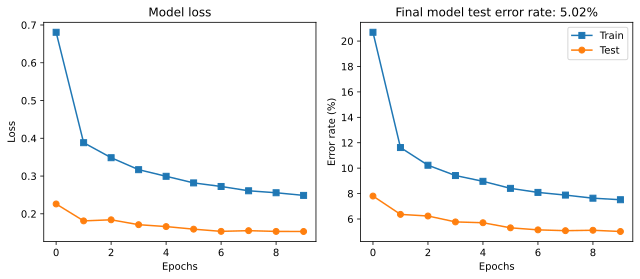

In [12]:
fig, ax = plt.subplots(1,2,figsize=(9,4))

ax[0].plot(trainLoss, 's-', label='Train')
ax[0].plot(testLoss, 'o-', label='Test')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Loss')
ax[0].set_title('Model loss')

ax[1].plot(trainErr, 's-', label='Train')
ax[1].plot(testErr, 'o-', label='Test')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Error rate (%)')
ax[1].set_title(f'Final model test error rate: {testErr[-1]:.2f}%')
ax[1].legend()

plt.tight_layout()
plt.show()

# Varying number of channels

In [ ]:
'''
* Explore the effects of channel count in the two convolution layers.
'''

## Create the DL model

In [14]:
def makeTheNet(numchans=(6,6)):

    class emnistnet(nn.Module):
        def __init__(self, numchans):
            super().__init__()

            # -------------------- feature map layers -------------------- #
            # first convolution layer
            self.conv1 = nn.Conv2d(1, numchans[0], 3, padding=1)
            self.bnorm1= nn.BatchNorm2d(numchans[0])

            # second convolution layer
            self.conv2 = nn.Conv2d(numchans[0], numchans[1], 3, padding=1)
            self.bnorm2 = nn.BatchNorm2d(numchans[1])

            # -------------------- linear decision layers -------------------- #
            self.fc1 = nn.Linear(7*7*numchans[1], 50)
            self.fc2 = nn.Linear(50, 26)

        def forward(self, x):

            # first block
            x = F.max_pool2d(self.conv1(x), 2)
            x = F.leaky_relu(self.bnorm1(x))

            # second block
            x = F.max_pool2d(self.conv2(x), 2)
            x = F.leaky_relu(self.bnorm2(x))

            # reshape for linear layer
            nUnits = x.shape.numel() / x.shape[0]
            x = x.view(-1, int(nUnits))

            # linear layers
            x = F.leaky_relu(self.fc1(x))
            x = self.fc2(x)

            return x

    net = emnistnet(numchans)
    lossfunc = nn.CrossEntropyLoss()
    optimizer = torch.optim.Adam(net.parameters(), lr=.001)

    return net, lossfunc, optimizer

In [16]:
# test the model with one batch
net, lossfunc, optimizer = makeTheNet((6,12))

X, y = next(iter(train_loader))
yHat = net(X)

print('\nOutput size:')
print(yHat.shape)

loss = lossfunc(yHat, torch.squeeze(y))
print('\nLoss:')
print(loss)


Output size:
torch.Size([32, 26])

Loss:
tensor(3.2775, grad_fn=<NllLossBackward0>)


## Create a function that trains the model

In [21]:
def function2trainTheModel(numchans):

    numepochs = 5

    net, lossfunc, optimizer = makeTheNet(numchans)

    net.to(device)

    trainLoss = torch.zeros(numepochs)
    testLoss = torch.zeros(numepochs)
    trainErr = torch.zeros(numepochs)
    testErr = torch.zeros(numepochs)

    for epochi in range(numepochs):

        net.train()

        batchLoss = []
        batchErr = []
        for X, y in train_loader:
            X = X.to(device)
            y = y.to(device)

            yHat = net(X)
            loss = lossfunc(yHat, y)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            batchLoss.append(loss.item())
            batchErr.append( 100 * torch.mean((torch.argmax(yHat, axis=1)!=y).float()).item() )

        trainLoss[epochi] = np.mean(batchLoss)
        trainErr[epochi] = np.mean(batchErr)

        net.eval()
        X, y = next(iter(test_loader))
        X = X.to(device)
        y = y.to(device)

        with torch.no_grad():
            yHat = net(X)
            loss = lossfunc(yHat, y)

        testLoss[epochi] = loss.item()
        testErr[epochi] = 100 * torch.mean((torch.argmax(yHat, axis=1)!=y).float()).item()

    return trainLoss, testLoss, trainErr, testErr, net

## Run the model and show the results!

In [22]:
trainLoss, testLoss, trainErr, testErr, net = function2trainTheModel((3,7))

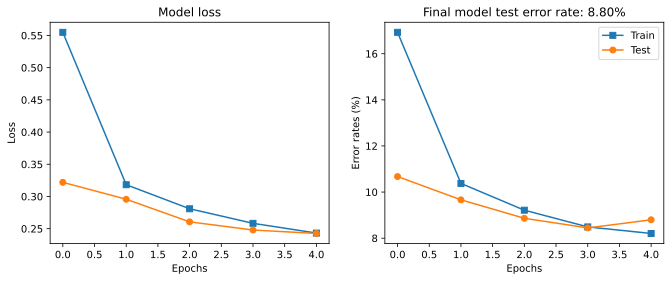

In [23]:
fig,ax = plt.subplots(1,2,figsize=(11,4))

ax[0].plot(trainLoss,'s-',label='Train')
ax[0].plot(testLoss,'o-',label='Test')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Loss')
ax[0].set_title('Model loss')

ax[1].plot(trainErr,'s-',label='Train')
ax[1].plot(testErr,'o-',label='Test')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Error rates (%)')
ax[1].set_title(f'Final model test error rate: {testErr[-1]:.2f}%')
ax[1].legend()

plt.show()

## Now for the experiment

In [25]:
# this experiment takes ~8 mins on a GPU
convChans = [2,5,8]

# initialize results matrix
results = np.zeros((len(convChans), len(convChans), 2))
convParams = np.zeros((len(convChans), len(convChans)))

for i, Nchani in enumerate(convChans):
    for j, Nchanj in enumerate(convChans):

        # run the model
        trainLoss, testLoss, trainErr, testErr, net = function2trainTheModel((Nchani, Nchanj))

        # get results
        results[i, j, 0] = trainErr[-1]
        results[i, j, 1] = testErr[-1]
        convParams[i, j] = Nchani + Nchanj # total number of convolution layer channels

        print(i, j)

0 0
0 1
0 2
1 0
1 1
1 2
2 0
2 1
2 2


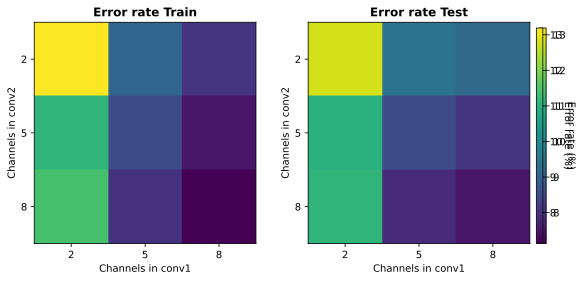

In [26]:
# Show the results matrix
fig, ax = plt.subplots(1,2,figsize=(9,4))

for i in range(2):
    h = ax[i].imshow(results[:,:,i], vmin=np.min(results), vmax=np.max(results))
    ax[i].set_xlabel('Channels in conv1')
    ax[i].set_ylabel('Channels in conv2')
    ax[i].set_xticks(range(j+1))
    ax[i].set_yticks(range(j+1))
    ax[i].set_xticklabels(convChans)
    ax[i].set_yticklabels(convChans)
    title = 'Train' if i==0 else 'Test'
    ax[i].set_title('Error rate %s' % title, fontweight='bold')

    # add a colorbar right of the plot (use common colorscaling for both plots)
    axpos = ax[1].get_position()
    cax = fig.add_axes([axpos.x1+.01, axpos.y0, .01, .75])
    hh = fig.colorbar(h, cax=cax)
    hh.set_label('Error rate (%)', rotation=270, labelpad=10)

plt.show()

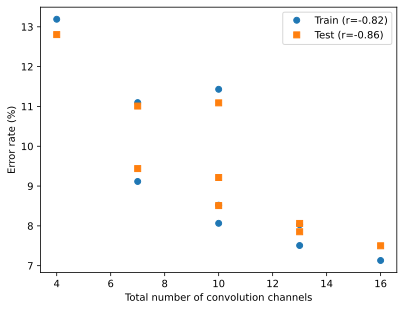

In [27]:
# error rate as a function of the total number of conv channels

corrTrain = np.corrcoef(convParams.flatten(), results[:,:,0].flatten())
corrTest  = np.corrcoef(convParams.flatten(),results[:,:,1].flatten())

# plots
plt.plot(convParams.flatten(),results[:,:,0].flatten(),'o',
         label=f'Train (r={corrTrain[0,1]:.2f})')
plt.plot(convParams.flatten(),results[:,:,1].flatten(),'s',
         label=f'Test (r={corrTest[0,1]:.2f})')

# other stuff etc
plt.legend()
plt.xlabel('Total number of convolution channels')
plt.ylabel('Error rate (%)')
plt.show()

In [12]:
'''
- The more convolution channels that we have in the model (more filters that we have), better the overall performance.
  which in this case means lower error rates.
- Correlations are quite strong.
- Comparable experiment with Feedforward network (Fully connected network) that simply adding more units to the hidden layers
  did not necessarily improve performance in this way.
- Overall model accuracy is generally not simply a function of the total number of trainable parameters.
- So in feedforward networks, it is not trivially case that adding more parameters for the model to learn necessarily improves overall accuracies of the model.
- However, in this experiment we found that adding more trainable parameters (more filter kernels for model to learn) and that alone
  was sufficient to improve model performance.
  '''

# So many possibilities! How to create a CNN?

In [ ]:
''' The problem
- There are so many options for architecture and metaparameters.
- It is literally impossible to evaluate even a reasonably complete set of possible models.
- Some architectures might be good for some datasets and bad for others.
- You can never be 100% confident that any given model (yours or anyone else's) it the best.

The solution
- Start from existing models, published, on github, kaggle, blogs, etc. Try to find models that are similar to what you need.
- Use transfer learning.
- Experiment, tweak, guess... be creative and think big.
- Write down the changes and performance!

'''